<a href="https://colab.research.google.com/github/DavidSenseman/BIO1173/blob/main/Class_04_1_Solutions.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

---------------------------
**COPYRIGHT NOTICE:** This Jupyterlab Notebook is a Derivative work of [Jeff Heaton](https://github.com/jeffheaton) licensed under the Apache License, Version 2.0 (the "License"); You may not use this file except in compliance with the License. You may obtain a copy of the License at

> [http://www.apache.org/licenses/LICENSE-2.0](http://www.apache.org/licenses/LICENSE-2.0)

Unless required by applicable law or agreed to in writing, software distributed under the License is distributed on an "AS IS" BASIS, WITHOUT WARRANTIES OR CONDITIONS OF ANY KIND, either express or implied. See the License for the specific language governing permissions and limitations under the License.

------------------------

# **BIO 1173: Intro Computational Biology**

##### **Module 4: ChatGPT and Large Language Models**

* Instructor: [David Senseman](mailto:David.Senseman@utsa.edu), [Department of Biology, Health and the Environment](https://sciences.utsa.edu/bhe/), [UTSA](https://www.utsa.edu/)

### Module 4 Material

* **Part 4.1: Introduction to Large Language Models (LLMs)**
* Part 4.2: Chatbots
* Part 4.3: Image Generation with StableDiffusion
* Part 4.4: Agentic AI


## Google CoLab Instructions

You MUST run the following code cell to get credit for this class lesson. By running this code cell, you will map your GDrive to /content/drive and print out your Google GMAIL address. Your Instructor will use your GMAIL address to verify the author of this class lesson.

In [1]:
# You must run this cell first
try:
    from google.colab import drive
    drive.mount('/content/drive', force_remount=True)
    from google.colab import auth
    auth.authenticate_user()
    Colab = True
    print("Note: Using Google CoLab")
    import requests
    gcloud_token = !gcloud auth print-access-token
    gcloud_tokeninfo = requests.get('https://www.googleapis.com/oauth2/v3/tokeninfo?access_token=' + gcloud_token[0]).json()
    print(gcloud_tokeninfo['email'])
except:
    print("**WARNING**: Your GMAIL address was **not** printed in the output below.")
    print("**WARNING**: You will NOT receive credit for this lesson.")
    Colab = False

Mounted at /content/drive
Note: Using Google CoLab
david.senseman@gmail.com


You should see the following output except your GMAIL address should appear on the last line.

![__](https://biologicslab.co/BIO1173/images/class_04/class_04_1_image01B.png)

If your GMAIL address does not appear your lesson will **not** be graded.

# **You MUST Obtain Your Gemini API Key Now!**

In order to run the code in the next few lessons, you will need to obtain a Google `Gemini API key` and install your key in the `Secrets` location in your Google Colab notebook. It is important to key your `Gemini API key` secret. If anyone learns your key, they can use it costing you a lot of money. Instructions for obtaining your API Key and how to store in your Colab Secrets was previously published as an class Announcement on Canvas.  

## **Test Your `GEMINI_API_KEY`**

To see if your `GEMINI_API_KEY` is correctly setup, run the next code cell.

In [2]:
from google.colab import userdata
import os

# Check if API key is properly loaded
try:
    # 1. Get the key from Secrets
    GOOGLE_API_KEY = userdata.get('GOOGLE_API_KEY')

    # 2. Set it as an environment variable
    os.environ['GOOGLE_API_KEY'] = GOOGLE_API_KEY

    print("API key loaded and environment variable set successfully!")
    print(f"Key length: {len(GOOGLE_API_KEY)}")

except Exception as e:
    print(f"Error loading API key: {e}")
    print("Please set your API key in Google Colab:")
    print("1. Go to Secrets in the left sidebar (key icon)")
    print("2. Create a new secret named 'GOOGLE_API_KEY'")
    print("3. Paste your GOOGLE API key and toggle 'Notebook access' on")

API key loaded and environment variable set successfully!
Key length: 39


* 1 You may see this message when you run this cell:


![__](https://biologicslab.co/BIO1173/images/class_04/class_04_1_image08C.png)

If you do see this popup just click on `Grant access`.


* 2. If your `GEMINI_API_KEY` is correctly installed you should see something _similar_ to the following output.

![__](https://biologicslab.co/BIO1173/images/class_04/class_04_1_image09C.png)

* 3. However, if you see the following output

![__](https://biologicslab.co/BIO1173/images/class_04/class_04_1_image10C.png)

You will need to correct the error before you can continue. Ask your Instructor or TA for help if you can resolve the error yourself.

### **YouTube Introduction to Large Language Models (LLMs)**

Run the next cell to see short introduction to Large Language Models (LLMs). This is a suggested, but optional, part of the lesson.

In [3]:
from IPython.display import HTML
video_id = "wjZofJX0v4M"
HTML(f"""
<iframe width="560" height="315"
  src="https://www.youtube.com/embed/{video_id}"
  title="YouTube video player"
  frameborder="0"
  allow="accelerometer; autoplay; clipboard-write; encrypted-media; gyroscope; picture-in-picture"
  allowfullscreen
  referrerpolicy="strict-origin-when-cross-origin">
</iframe>
""")

# **Introduction to Large Language Models (LLMs)**

**Large Language Models (LLMs)** such as `Gemini` have brought AI into mainstream use. LLMs allow regular users to interact with AI using natural language. Most of these language models require extreme processing capabilities and hardware. Because of this, application programming interfaces (APIs) accessed through the Internet are becoming common entry points for these models. One of the most compelling features of services like Gemini is their availability as an API. But before we dive into the depths of coding and integration, let's understand what an API is and its significance in the AI domain.

API stands for **Application Programming Interface**. Think of it as a bridge or a messenger that allows two different software applications to communicate. In the context of AI and machine learning, APIs often allow developers to access a particular model or service without having to house the model on their local machine. This technique can be beneficial when the model in question, like `Gemini`, is large and resource-intensive.



In the realm of AI, APIs have several distinct advantages:

**1. Scalability:** Since the actual model runs on external servers, developers don't need to worry about scaling infrastructure.
**2. Maintenance:** You get to use the latest and greatest version of the model without constantly updating your local copy.
**3. Cost-Effective:** Leveraging external computational resources can be more cost-effective than maintaining high-end infrastructure locally, especially for sporadic or one-off tasks.
**4. Ease of Use:** Instead of diving into the nitty-gritty details of model implementation and optimization, developers can directly utilize its capabilities with a few lines of code.

In this section, we won't be running the neural network computations locally. We will use the new Google Gen AI SDK to communicate with the `Gemini API` to access and harness the abilities of the latest Gemini models. The actual execution of the neural network code happens on `Google servers`, bringing forth a unique synergy of Python's flexibility and Gemini's multimodal mastery. (NOTE: The physical location of these servers is managed by Google Cloud).

In this section, we will make use of the `Google Gemini API`. Further information on this API can be found here:

* [Google AI Studio Login/Registration](https://aistudio.google.com/)
* [Gemini API Overview](https://ai.google.dev/gemini-api/docs)
* [Gemini Python SDK Reference](https://ai.google.dev/api/python/google/genai)
* [Google Gen AI SDK GitHub](https://github.com/googleapis/python-genai)
* [Gemini API Cookbook](https://github.com/google-gemini/cookbook)
* [LangChain for Gemini](https://python.langchain.com/docs/integrations/chat/google_generative_ai/)

## **Installing LangChain to use the Google Gen AI SDK**

As we delve deeper into the intricacies of deep learning, it's crucial to understand that the tools and platforms we use are as versatile as the concepts themselves. When it comes to accessing Gemini, a state-of-the-art multimodal AI model developed by Google, there are two predominant pathways:

**Direct API Access using Python's HTTP Capabilities:** Python, with its rich library ecosystem, provides utilities like `requests` to directly communicate with APIs over HTTP. This method involves crafting the necessary REST API calls, handling JSON responses, and error checking, giving the developer granular control over the process.

**Using the Official Google Gen AI SDK:** Google offers an official Python SDK (often via the `google-genai` or `google-generativeai` packages) that simplifies the process of integrating with Gemini and other Google AI services. This library abstracts many of the intricacies and boilerplate steps of direct API access, offering a streamlined and user-friendly approach to interacting with the model.

Each approach has its advantages. `Direct API access` provides a more hands-on, granular approach, allowing developers to intimately understand the intricacies of each API call. On the other hand, using the `Google Gen AI SDK` can accelerate development, reduce potential errors, and allow for a more straightforward integration, especially for those new to API interactions.

We will make use of the `Gemini API` through a library called `LangChain`. `LangChain` is a framework designed to simplify the creation of applications using LLMs. As a language model integration framework, `LangChain's` use-cases largely overlap with those of language models in general, including document analysis and summarization, chatbots, and code analysis. `LangChain` allows you to quickly change between different underlying LLMs—switching from OpenAI to Gemini, for example—with minimal code changes.

### Install `langchain`

Run the code in the next cell to install the `langchain`modules.

In [4]:
!pip install -q langchain_google_genai

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 53.1/53.1 kB 3.5 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 66.5/66.5 kB 4.6 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 719.4/719.4 kB 30.4 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 236.5/236.5 kB 22.0 MB/s eta 0:00:00
ERROR: pip's dependency resolver does not currently take into account all the packages that are installed. This behaviour is the source of the following dependency conflicts.
google-colab 1.0.0 requires google-auth==2.43.0, but you have google-auth 2.48.0 which is incompatible.


If the code is correct your should see something _similar_ to the following output

![__](https://biologicslab.co/BIO1173/images/class_04/class_04_1_image19F.png)

Don't worry about the error message.

### List Current Google Gemini Models

Run the code in the next cell to generate a table showing the various models that you can currently access using your Gemini API Key.

In [5]:
# List Current Google Gemini Models

from google import genai
import os

# --- 1. SETUP & AUTHENTICATION ---
try:
    # Use the environment variable that was already set
    api_key = os.environ['GOOGLE_API_KEY']

    # Create a client with the key
    client = genai.Client(api_key=api_key)
    print("Authentication successful.\n")

except KeyError:
    print("API key not found. Please run the setup cell first.")

# --- 2. PRINT HEADER ---
print(f"{'Model Name':<60} {'Display Name':<40}")
print("-" * 130)

# --- 3. PRINT ROWS ---
try:
    for m in client.models.list():
        print(f"{m.name:<60} {m.display_name:<40}")

except Exception as e:
    print(f"\nError listing models: {e}")


Authentication successful.

Model Name                                                   Display Name                            
----------------------------------------------------------------------------------------------------------------------------------
models/embedding-gecko-001                                   Embedding Gecko                         
models/gemini-2.5-flash                                      Gemini 2.5 Flash                        
models/gemini-2.5-pro                                        Gemini 2.5 Pro                          
models/gemini-2.0-flash-exp                                  Gemini 2.0 Flash Experimental           
models/gemini-2.0-flash                                      Gemini 2.0 Flash                        
models/gemini-2.0-flash-001                                  Gemini 2.0 Flash 001                    
models/gemini-2.0-flash-exp-image-generation                 Gemini 2.0 Flash (Image Generation) Experimental
models/gemini-2.0

### **Current Gemini API Models (January 2026)**

As of January 2026, the Gemini API primarily utilizes the **Gemini 2.0** and **Gemini 2.5** series.

#### **1. Gemini 2.5 Series (Newest Flagship)**
*   **`gemini-2.5-pro`**: The most advanced reasoning model with enhanced "thinking" capabilities for complex coding, math, and multimodal tasks. Includes a **1M token context window**.
*   **`gemini-2.5-flash`**: A fast, efficient model that also supports thinking capabilities. Great balance of speed and intelligence for most tasks.
*   **`gemini-2.5-flash-lite-preview`**: An ultra-efficient version designed for high-throughput tasks at lower cost.

#### **2. Gemini 2.0 Series (Stable Production)**
*   **`gemini-2.0-flash`**: Fast and versatile model optimized for diverse, everyday tasks. Good for production use cases requiring speed.
*   **`gemini-2.0-flash-lite`**: Lightweight version for cost-sensitive, high-volume applications.

#### **3. Specialized Models**
*   **`gemini-2.0-flash-live-001`**: Optimized for the Live API to support real-time, bidirectional voice and video interactions.
*   **`gemini-2.5-pro-preview-tts`**: Specialized text-to-speech model for generating expressive, natural audio output.
*   **`gemini-2.5-flash-preview-native-audio`**: Native audio generation capabilities for multimodal applications.

#### **4. Legacy Models**
*   **`gemini-1.5-pro`** / **`gemini-1.5-flash`**: Still available but recommended to migrate to 2.0 or 2.5 series for improved performance.

---


## **Prompt Engineering**

When working with a large language model (LLM) like ChatGPT or Gemini, the **prompt** serves as the foundation for interaction. It is the input or instruction provided to the model, guiding it to generate relevant and useful outputs.

**1. Role of the Prompt**
- **Instructional Guide**: The prompt shapes what the model does. Whether it's answering a question, completing a task, or writing creatively, the prompt provides the necessary context.  
- **Boundary Setter**: A well-crafted prompt can define the scope of the task, ensuring the response is focused and doesn't deviate from the topic.  
- **Task Optimizer**: By providing clear and concise instructions, the prompt ensures that the LLM generates responses that align with user expectations.

**2. Importance of the Prompt**
- **Determines Quality of Output**: The quality of the model's response depends heavily on the clarity and specificity of the prompt. A vague prompt can lead to irrelevant or incomplete answers, while a precise one produces accurate and valuable results.
- **Customizable Interactions**: Prompts allow users to adapt the model to different scenarios—such as summarization, translation, or brainstorming—making it versatile and dynamic.  
- **Reduces Ambiguity**: A good prompt minimizes room for misunderstanding, helping the model interpret the task as intended.  

**3. Iterative Improvement**
Working with LLMs is often an _iterative_  process. If the initial response isn't quite right, the user can refine the prompt, adding more detail or constraints to guide the model toward the desired result. Instead of starting over from scratch, you just edit the prompt and try it again.

The prompt isn't just the input—it’s the bridge between the user’s needs and the model’s capabilities. Mastering prompt design is key to fully leveraging the potential of an LLM like Gemini or ChatGPT.


### Example 1: Basic Query to LangChain

We begin by writing a **prompt**, to ask (query) `Gemini` a simple question: "What are the 5 most prestigous medical schools in the USA?".

The Python code in the cell below interacts with `Gemini 2.0 flash` using `LangChain` to retrieve our answer. Since Gemini can be a wordy, we tell the LLM to only provide a list using this prompt:

```python
# Specify question
question = "Provide just a list of five most prestigious medical schools in the US?"
```
Crafting a prompt so that the LLM provides the information you want is called `prompt engineering`.

**NOTE:** This cell will not run if you do not have a valid GEMINI_API_KEY already installed in Google Colab's `Secrets`.


In [6]:
# Example 1: Basic Query (Client-Side Limit)

from google.colab import userdata
from langchain_google_genai import ChatGoogleGenerativeAI
from IPython.display import display, Markdown


# Specify question
question = "Provide just a list of five most prestigious medical schools in the US?"
print(f"Question: {question}\n")

# 1. Setup
gemini_key = userdata.get('GOOGLE_API_KEY')

# Specify which model to use
llm = ChatGoogleGenerativeAI(
    google_api_key=gemini_key,
    model="gemini-2.0-flash",
    temperature=0
)

# 2. Define our Hard Limit (in characters)
MAX_CHARS = 500

# 3. Submit question to LLM
try:
    streamed_text = ""
    display_handle = display(Markdown(""), display_id=True)

    # 3. Stream and Monitor
    for chunk in llm.stream(question):
        streamed_text += chunk.content

        # Update the display
        display_handle.update(Markdown(streamed_text))

        # Check if we have exceeded our manual limit
        if len(streamed_text) > MAX_CHARS:
            # Append a notice so the user knows why it stopped
            display_handle.update(Markdown(streamed_text + "...\n\n**(Stopped by Client-Side Limit)**"))
            break # Forcefully exit the loop

except Exception as e:
    print(f"Error during query: {e}")

Question: Provide just a list of five most prestigious medical schools in the US?



1.  Harvard Medical School
2.  Johns Hopkins University School of Medicine
3.  Perelman School of Medicine at the University of Pennsylvania
4.  Stanford University School of Medicine
5.  UCSF School of Medicine


If the code is correct your should see something _similar_ to the following output

![__](https://biologicslab.co/BIO1173/images/class_04/class_04_1_image01F.png)

As you can see, the response from `LangChain` is in regular English, complete with formatting. While the formatting may make it easier to read, we often have to parse the results given to us by LLMs.

Later, we will see that `LangChain` can help with this as well. You will also notice that we specified a value of `0` for **temperature**; this instructs the LLM to be less creative with its responses and more consistent. Because we are working primarily with data extraction in this section, a low temperature will give us more consistent results.

In `LangChain` (specifically for Gemini models), the temperature parameter typically ranges from **0.0** to **2.0**. The temperature controls the randomness of the model's output:

* **Low Temperature (e.g., 0.0):** Produces more deterministic and focused responses, ideal for tasks requiring precision.

* **High Temperature (e.g., 1.0 - 2.0):** Generates more creative and diverse outputs, useful for brainstorming or creative writing.

If you're working with `LangChain` and `Gemini models`, you can set the temperature when initializing the model or during runtime.

### **Exercise 1: Basic Query to LangChain**

For **Exercise 1** think about a subject for a `Top Five List` that **you** find interesting and see what response you get back from `ChatGTP`.

Feel free to change the **temperature** of your request if you want a more _creative_ response from `LangChain`. There are no "right" or "wrong" answers here as long as your code works.

In [7]:
# Insert your code for Exercise 1 here

from google.colab import userdata
from langchain_google_genai import ChatGoogleGenerativeAI
from IPython.display import display, Markdown


# Specify question
question = "Provide just a list of five most famous rock-and-roll guitarists?"
print(f"Question: {question}\n")

# 1. Setup
gemini_key = userdata.get('GOOGLE_API_KEY')

# Specify which model to use
llm = ChatGoogleGenerativeAI(
    google_api_key=gemini_key,
    model="gemini-2.0-flash",
    temperature=0
)

# 2. Define our Hard Limit (in characters)
MAX_CHARS = 500

# 3. Submit question to LLM
try:
    streamed_text = ""
    display_handle = display(Markdown(""), display_id=True)

    # 3. Stream and Monitor
    for chunk in llm.stream(question):
        streamed_text += chunk.content

        # Update the display
        display_handle.update(Markdown(streamed_text))

        # Check if we have exceeded our manual limit
        if len(streamed_text) > MAX_CHARS:
            # Append a notice so the user knows why it stopped
            display_handle.update(Markdown(streamed_text + "...\n\n**(Stopped by Client-Side Limit)**"))
            break # Forcefully exit the loop

except Exception as e:
    print(f"Error during query: {e}")

Question: Provide just a list of five most famous rock-and-roll guitarists?



1.  Jimi Hendrix
2.  Eric Clapton
3.  Jimmy Page
4.  Chuck Berry
5.  Keith Richards


Since I am interested in guitar players, I asked  for a list of the 5 greatest guitart players of all time.

![__](https://biologicslab.co/BIO1173/images/class_04/class_04_1_image02F.png)

You output will be different depending up your question.

### Example 2: Working with Prompts

As mentioned above, interactions with LLMs is typically accomplished using `prompts`and that there is a whole new field called **Prompt Engineering** that focuses on designing, refining, and optimizing prompts to maximize the effectiveness and relevance of outputs generated by large language models (LLMs) like Gemini 2.5 Pro, Gemini Flash, and others.

In Example 2, we will "engineer" a prompt that will have `Gemini` translate text from French to English. We don't need to tell Gemini what language of our text is, it is smart enough to figure it out by itself.

In this example, we will just be using normal Python `f-strings` to build the prompt.

In [8]:
# Example 2: Working with Prompts

from langchain_google_genai import ChatGoogleGenerativeAI
from google.colab import userdata
from IPython.display import display, Markdown

# Define our Hard Limit (in characters)
MAX_CHARS = 500

# Define text and style
text = """Laissez les bons temps rouler"""  # What we want translated
style = "American English"

# Build prompt
prompt = f"""Translate the text \
that is delimited by triple backticks \
into a style that is {style}. \
text: ```{text}```
"""

# Uncomment next line to print prompt
# print(f"Prompt: {prompt}\n")

# 1. Setup API Key
api_key = userdata.get('GOOGLE_API_KEY')

# 2. Initialize the Gemini Model
llm = ChatGoogleGenerativeAI(
    model="gemini-2.0-flash",
    google_api_key=api_key
)

# 3. Submit question to LLM
try:
    streamed_text = ""
    display_handle = display(Markdown(""), display_id=True)

    # 3. Stream and Monitor
    for chunk in llm.stream(prompt):
        streamed_text += chunk.content

        # Update the display
        display_handle.update(Markdown(streamed_text))

        # Check if we have exceeded our manual limit
        if len(streamed_text) > MAX_CHARS:
            # Append a notice so the user knows why it stopped
            display_handle.update(Markdown(streamed_text + "...\n\n**(Stopped by Client-Side Limit)**"))
            break # Forcefully exit the loop


except Exception as e:
    print(f"Error during query: {e}")

Let the good times roll!


If the code is correct you should see the following output

```text
Let the good times roll.
```

--------------------------

**Why does the code Uses Triple Quotes?**

The code in the cell above uses triple double quotes (""") for the prompt string to allow for clean, multi-line formatting and to include special characters, such as backticks (```) and placeholders ({style} and {text}).

~~~text
prompt = f"""Translate the text \
that is delimited by triple backticks \
into a style that is {style}. \
text: ```{text}```"""
~~~

-------------------------


### **Exercise 2: Working with Prompts**

In the cell below, use `Gemini-2.0-flash`  to translate the German expression: "Ein Prosit der Gemütlichkeit" into English.


In [9]:
# Insert your code for Exercise 2 here

from langchain_google_genai import ChatGoogleGenerativeAI
from google.colab import userdata
from IPython.display import display, Markdown

# Define our Hard Limit (in characters)
MAX_CHARS = 500

# Define text and style
text = """Ein Prosit der Gemütlichkeit"""
style = "American English"
"Президент Трамп, русская Родина сдаётся"
# Build prompt
prompt = f"""Translate the text \
that is delimited by triple backticks \
into a style that is {style}. \
text: ```{text}```
"""
# Uncomment next line to print prompt
# print(f"Prompt: {prompt}\n")

# 1. Setup API Key
api_key = userdata.get('GOOGLE_API_KEY')

# 2. Initialize the Gemini Model
llm = ChatGoogleGenerativeAI(
    model="gemini-2.0-flash",
    google_api_key=api_key
)

# 3. Submit question to LLM
try:
    streamed_text = ""
    display_handle = display(Markdown(""), display_id=True)

    # 3. Stream and Monitor
    for chunk in llm.stream(prompt):
        streamed_text += chunk.content

        # Update the display
        display_handle.update(Markdown(streamed_text))

        # Check if we have exceeded our manual limit
        if len(streamed_text) > MAX_CHARS:
            # Append a notice so the user knows why it stopped
            display_handle.update(Markdown(streamed_text + "...\n\n**(Stopped by Client-Side Limit)**"))
            break # Forcefully exit the loop


except Exception as e:
    print(f"Error during query: {e}")

Here's the translation of "Ein Prosit der Gemütlichkeit" into American English, with a few options depending on the desired nuance:

*   **Option 1 (Most common and direct):** A toast to fellowship and good cheer!

*   **Option 2 (Slightly more literal, but still understandable):** A toast to coziness and good times!

*   **Option 3 (Focusing on the feeling):** Here's to good times and good company!

*   **Option 4 (More informal):** Cheers to good times and good company!


If the code is correct you should see something _similar_ to the following output

![__](https://biologicslab.co/BIO1173/images/class_04/class_04_1_image03F.png)

## **Dynamic Prompts**

A **dynamic prompt** is a flexible and adaptive input designed for interaction with language models (LLMs) like `Gemini`, where placeholders or variables are used to customize the prompt based on context or user-provided information.

This approach allows for reusability, personalization, and automation, ensuring that the output is tailored to specific needs without rewriting the entire prompt.

---

#### **Key Characteristics of a Dynamic Prompt**
1. **Variables**:
   - Dynamic prompts include placeholders for variables, like `{name}`, `{style}`, or `{text}`, which can be filled with different values at runtime.
   - For example:
     ```python
     prompt = f"Translate this text: {text} into {language}."
     ```
     Here, `{text}` and `{language}` can be dynamically replaced by the desired input values.
2. **Context-Aware**:
   - They adapt to the context, such as the user’s preferences, conversation history, or specific tasks.
   - For instance, a dynamic prompt for summarization might consider the length of the desired output: "Summarize the following article in less than {words} words."
3. **Reusable Templates**:
   - Instead of hardcoding individual tasks, dynamic prompts use templates that can be applied across multiple scenarios by simply replacing values.
   - Example template:
     ```python
     eg_template_text = """Write a {tone} response to the following message:
     message: {user_message}"""
     ```
4. **Personalization**:
   - Dynamic prompts can be personalized based on user inputs or profiles, enhancing user experience. For example:
     ```python
     f"Hi {name}, here’s the weather forecast for {city}!"
     ```

#### **Why Are Dynamic Prompts Important?**

- **Efficiency**: They save time by enabling template reuse.
- **Scalability**: Useful for applications needing to handle diverse inputs.
- **Adaptability**: They produce tailored outputs depending on the specific context or task.
- **User Experience**: Personalization through dynamic prompts improves user satisfaction.

---

Dynamic prompts are at the heart of effective interactions with LLMs, making them more versatile, context-aware, and user-specific.

### Example 3: Create and Use a Dynamic Prompt

The code in the cell below creates a **Dynamic Prompt**. The process has been broken down into 5 steps to make it easier to understand the process. The key step is to define the `source text` using this code:

```python
source_text = "千里之行，始于足下。"
```

By simply changing the `source_text` you can translate almost any language into English.

In this example, the prefix `eg_` has been added to several variable names to keep them separate from similar variables that you will need to create in the exercises.

To keep the output manageable, an output limit of 500 characters has been added.

In [10]:
# Example 3: Create and Use a Dynamic Prompt

# Initialize Client
from google import genai
from google.colab import userdata
from IPython.display import display, Markdown

# 1. Setup Client
try:
    GOOGLE_API_KEY = userdata.get('GOOGLE_API_KEY')
    client = genai.Client(api_key=GOOGLE_API_KEY)
except Exception as e:
    print(f"Error checking API key: {e}")

# 2. Define Variables
target_style = "American English"
source_text = "千里之行，始于足下。"

# 3. Build the Prompt
eg_prompt = f"""Translate the text \
that is delimited by triple backticks \
into a style that is {target_style}. \
text: ```{source_text}```
"""

print(f"--- Prompt Sent to Model ---\n{eg_prompt}\n")

# 4. Define our Hard Limit
MAX_CHARS = 500

# 5. Stream the response
streamed_text = ""
display_handle = display(Markdown("Waiting for stream..."), display_id=True)

try:
    # Use client.models.generate_content_stream for streaming
    response_stream = client.models.generate_content_stream(
        model="gemini-2.0-flash",
        contents=eg_prompt
    )

    for chunk in response_stream:
        # In the new SDK, chunk.text provides the text content directly
        if chunk.text:
            streamed_text += chunk.text

            # Check if we've exceeded the limit
            if len(streamed_text) >= MAX_CHARS:
                final_output = streamed_text[:MAX_CHARS] + "...\n\n**(Stopped by Client-Side Limit)**"
                display_handle.update(Markdown(final_output))
                break

            # Update the live display with the current text
            display_handle.update(Markdown(streamed_text))

except Exception as e:
    # Fixed the syntax error here
    print(f"Error during query: {e}")

--- Prompt Sent to Model ---
Translate the text that is delimited by triple backticks into a style that is American English. text: ```千里之行，始于足下。```




Okay, here's the American English translation of the provided Chinese proverb:

"```A journey of a thousand miles begins with a single step.```"

**Explanation of Changes:**

*   The literal translation might be something closer to "A thousand *li* journey starts under the foot."
*   "Li" is a Chinese unit of measurement. Since most Americans aren't familiar with this, "miles" is substituted for better comprehension.
*   "Begins with" is a more natural and common phrasing in American English tha...

**(Stopped by Client-Side Limit)**

If the code is correct you should see something _similar_ to the following output

![__](https://biologicslab.co/BIO1173/images/class_04/class_04_1_image04F.png)

This newly constructed prompt can now perform the intended task of translation.

### **Exercise 3 - Create and Use a Dynamic Prompt**

In the cell below, write the code to translate this text "Президент Трамп, русская Родина сдаётся" into English.


In [11]:
# Insert your code for Exercise 3 here

# Initialize Client
from google import genai
from google.colab import userdata
from IPython.display import display, Markdown

# 1. Setup Client
try:
    GOOGLE_API_KEY = userdata.get('GOOGLE_API_KEY')
    client = genai.Client(api_key=GOOGLE_API_KEY)
except Exception as e:
    print(f"Error checking API key: {e}")

# 2. Define Variables
target_style = "American English"
source_text = "Президент Трамп, русская Родина сдаётся"

# 3. Build the Prompt
eg_prompt = f"""Translate the text \
that is delimited by triple backticks \
into a style that is {target_style}. \
text: ```{source_text}```
"""

print(f"--- Prompt Sent to Model ---\n{eg_prompt}\n")

# 4. Define our Hard Limit
MAX_CHARS = 500

# 5. Stream the response
streamed_text = ""
display_handle = display(Markdown("Waiting for stream..."), display_id=True)

try:
    # Use client.models.generate_content_stream for streaming
    response_stream = client.models.generate_content_stream(
        model="gemini-2.0-flash",
        contents=eg_prompt
    )

    for chunk in response_stream:
        # In the new SDK, chunk.text provides the text content directly
        if chunk.text:
            streamed_text += chunk.text

            # Check if we've exceeded the limit
            if len(streamed_text) >= MAX_CHARS:
                final_output = streamed_text[:MAX_CHARS] + "...\n\n**(Stopped by Client-Side Limit)**"
                display_handle.update(Markdown(final_output))
                break

            # Update the live display with the current text
            display_handle.update(Markdown(streamed_text))

except Exception as e:
    # Fixed the syntax error here
    print(f"Error during query: {e}")

--- Prompt Sent to Model ---
Translate the text that is delimited by triple backticks into a style that is American English. text: ```Президент Трамп, русская Родина сдаётся```




Here are a few options for translating the Russian phrase "Президент Трамп, русская Родина сдаётся" into American English, with slightly different nuances:

**Option 1 (Direct Translation, Emphasizing Surrender):**

> President Trump, the Russian Motherland surrenders.

This is the most literal translation and clearly conveys the message of capitulation.

**Option 2 (Slightly More Figurative, Emphasizing Russia):**

> President Trump, Russia surrenders.

This is slightly less dramatic but still ...

**(Stopped by Client-Side Limit)**

If the code is correct you should see something _similar_ to the following output

![__](https://biologicslab.co/BIO1173/images/class_04/class_04_1_image05F.png)

# LLM Memory

Human minds have both **long-term memory** and **short-term memory**. Long-term memory is what the human has learned throughout their lifetime. Short-term memory is what a human has only recently discovered in the last minute or so. For humans, learning is converting short-term memory into long-term memory that we will retain.

This process works somewhat differently for a LLM. Long-term memory was the weight of the neural network when it was initially trained or finetuned. Short-term memory is additional information that we wish the LLM to retain from previous prompts. For example, if the first prompt is "My name is David", the LLM will likely tell you hello and repeat your name. However, the LLM will not know the answer if the second prompt is "What is my name." without adding a memory component.

These memory objects, which LangChain provides, provide a sort of short-term memory. It is important to note that these objects are not affecting the long-term memory of the LLM, and once you discard the memory object, the LLM will forget. Additionally, the memory object can only hold so much information; newer information may replace older information once it is filled.

One important point to remember is that LLM's only have their input prompt. To provide such memory, these objects are appending anything we wish the LLM to remember to the input prompt. This section will see two ways to augment the prompt with previous information: a buffer and a summary. The buffer prepends a script of the last conversation up to this point. The summary approach keeps a consistently updated summary paragraph of the conversation.m and short-term memory. **Long-term memory** is what the human has learned throughout their lifetime. **Short-term memory** is what a human has only recently discovered in the last minute or so. For humans, learning is converting short-term memory into long-term memory that we will retain.

This process works somewhat differently for an LLM.

* **Long-term memory** was the weight of the neural network when it was initially trained or finetuned.
* **Short-term memory** is additional information that we wish the LLM to retain from previous prompts in the current session.

For example, if the first prompt is *"My name is David"*, the LLM will likely tell you hello and repeat your name. However, the LLM will not know the answer if the second prompt is *"What is my name?"* without adding a memory component.

### How the Google GenAI SDK handles this

In the **Google GenAI SDK**, this short-term memory is handled by the **Chat Session** (`client.chats.create`). It is important to note that this session history does not affect the *long-term* memory (weights) of the LLM; once you restart the runtime or discard the chat object, the LLM will forget the conversation.

One important point to remember is that LLMs technically only have their current input prompt. To provide "memory," the SDK automatically appends the entire history of the conversation to your new prompt behind the scenes.

**The Context Window Advantage**
Unlike older libraries that required complex "Buffer" or "Summary" objects to manage limited space, the Gemini models used by this SDK have massive **Context Windows** (up to 1-2 million tokens). This allows the SDK to simply retain the full "Buffer" of your conversation history without needing to summarize or truncate it as frequently.

# Custom Conversation Bots (Google GenAI SDK)

A **Custom Conversation Bot** is an AI-powered system built using the `google-genai` library that engages in natural language conversations while strictly adhering to a specific persona or domain.

In the code below, we will create a **Renal Assistant**—a bot customized specifically for nephrology that can "see" medical images and remember patient symptoms.

### Key Features in the New SDK

* **System Instructions (Persona):**
    Instead of complex prompt templates, we use the `system_instruction` parameter to define exactly how the bot behaves (e.g., *"You are a Physician's Assistant," "Do not diagnose"*). This instruction persists throughout the entire conversation.

* **Native Multimodality:**
    Modern custom bots are not limited to text. As demonstrated with our `analyze_local_image` function, the bot can seamlessly process text and images (like lab results or kidney scans) in the same message to provide context-aware analysis.

* **Automatic Session Memory:**
    The SDK's `client.chats.create` object automatically manages the conversation history. It remembers the user's name, previous symptoms, and uploaded images without the developer needing to manually store or summarize the text.

### Common Use Cases
* **Healthcare Triage:** (e.g., Our Renal Health Assistant)
* **Customer Support:** Answering FAQs based on specific company policies.
* **Educational Tutoring:** A history tutor that roleplays as a historical figure.
* **Technical Analysis:** debugging code or analyzing charts uploaded by the user.

### Summary
Custom conversation bots using the Google GenAI SDK are flexible, intelligent tools. By combining **System Instructions** with **Multimodal capabilities**, developers can rapidly create specialized assistants that are far more capable than generic chatbots.

### Example 4A: Create a Custom Conversation Bot

In Example 4 we are going to create a custom conversational bot named "AI Physician's Assistant" that is designed to help screen phone calls to a medical clinic.

The most important step is the creation of a **Persona** for the Custom Bot. Here is the code used to create the Persona (System Instructions) for our AI Physician's Assistant:

```python

# 2. Define the Persona (System Instruction)
system_instruction_text = """
You are a medical AI Physician's Assistant specializing in Nephrology.
Your role is to have a friendly conversation with a patient.

Guidance:
- ONLY discuss topics related to renal (kidney) health issues.
- If the user asks about other medical conditions (e.g., heart, lungs), politely redirect them to a general practitioner.
- If the user asks non-medical questions, steer them back to kidney health.
- Ask follow-up questions to better understand symptoms (e.g., color of urine, pain levels).
- IMPORTANT: Do not provide definitive medical diagnoses or prescribe medication.
- ALWAYS recommend seeing a doctor for official treatment.
"""
```
Notice that an important part of creating a Persona is providing `Guidance` so that the Custom Bot has a solid framework in which to work. In this particular example we have created the Custom Bot that is specialized in **nephrology**, which is the clinical aspects of kidney function.

As in previous examples, the prefix "eg_" has been added to key variables to separate the Bot in the example form the Bot you will make in the next exercise.

In [13]:
# Example 4A: Create a Custom Conversation Bot

from google import genai
from google.genai import types
from google.colab import userdata
import textwrap
from IPython.display import display, Markdown

# 1. Setup Client and Key
try:
    GOOGLE_API_KEY = userdata.get('GOOGLE_API_KEY')
    client = genai.Client(api_key=GOOGLE_API_KEY)
except Exception as e:
    print(f"Error: Please set your GOOGLE_API_KEY in the Secrets tab. Details: {e}")

# 2. Define the Persona (System Instruction)
eg_system_instruction_text = """
You are a medical AI Physician's Assistant specializing in Nephrology.
Your role is to have a friendly conversation with a patient.

Guidance:
- ONLY discuss topics related to renal (kidney) health issues.
- If the user asks about other medical conditions (e.g., heart, lungs), politely redirect them to a general practitioner.
- If the user asks non-medical questions, steer them back to kidney health.
- Ask follow-up questions to better understand symptoms (e.g., color of urine, pain levels).
- IMPORTANT: Do not provide definitive medical diagnoses or prescribe medication.
- ALWAYS recommend seeing a doctor for official treatment.
"""

# 3. Create the Chat Session
eg_chat = client.chats.create(
    model="gemini-2.0-flash",
    config=types.GenerateContentConfig(
        system_instruction=eg_system_instruction_text,
        temperature=0.7,
        max_output_tokens=500
    )
)

print("AI Physician's Assistant is ready.")

# --- HELPER FUNCTION TO CHAT ---
def eg_send_message_to_assistant(user_input):
    """Sends a message to the active chat session and prints the response."""
    try:
        # The SDK automatically appends this to history
        response = eg_chat.send_message(user_input)

        # Display results nicely in Colab
        print(f"\nUser: {user_input}")
        print("Physician's Assistant:")
        display(Markdown(response.text))

    except Exception as e:
        print(f"An error occurred: {e}")


AI Physician's Assistant is ready.


If the code is correct, you should see the following output:

```text
AI Physician's Assistant is ready.
```

### Example 4B: Test the Custom Bot

The code in the cell below sends several messages to our `AI Physician Assistant` to test the Custom Bot's ability to automously handle a call from a patient seeking medical advice.

In [14]:
# Example 4B: Test the Custom Bot


# Create and send messages to the bot

# Message 1: Relevant topic
eg_send_message_to_assistant("Doc, I am having trouble peeing.")

# Message 2: Testing memory (The bot should remember the previous context)
eg_send_message_to_assistant("It hurts a little bit, and it happens mostly at night.")

# Message 3: Testing the guardrails (Irrelevant topic)
eg_send_message_to_assistant("Can you also check why my knee hurts?")


User: Doc, I am having trouble peeing.
Physician's Assistant:


I understand you're having trouble peeing. That can be quite uncomfortable and concerning. To help me understand the situation better, could you tell me more about what you're experiencing?

For example:

*   Are you having trouble starting to pee, or is it more about the flow once you start?
*   Do you feel like you need to go frequently, even if you don't pass much urine?
*   Is there any pain or burning sensation when you urinate?
*   What color is your urine? Is it cloudy, or does it have any blood in it?

The more details you can provide, the better I can understand what might be going on. Remember, I'm here to gather information and provide general guidance, but I can't give you a diagnosis or prescribe treatment. It's essential to see a doctor for that.



User: It hurts a little bit, and it happens mostly at night.
Physician's Assistant:


Okay, you're experiencing some pain while urinating, and it's more frequent at night. Thanks for sharing that.

A few more questions to help me understand:

*   Could you describe the pain a little more? Is it a sharp, burning, or dull ache? Where do you feel the pain most intensely?
*   When you say it happens mostly at night, do you find yourself waking up multiple times to urinate?
*   Have you noticed any changes in the amount of urine you pass at night compared to the daytime?
*   Also, have you noticed any other symptoms, such as fever, lower back pain, or changes in your urine (like cloudiness or a strong odor)?

It's good you're paying attention to these changes, as they can provide important clues. However, to figure out what's causing this and get the right treatment, it's important to consult with a doctor. They can run the necessary tests and provide an accurate diagnosis.



User: Can you also check why my knee hurts?
Physician's Assistant:


I understand you're also experiencing knee pain, but since I'm focused on kidney-related issues, I'm not the best resource for that. For your knee, I would recommend seeing a general practitioner or an orthopedist. They'll be able to properly evaluate your knee and determine the cause of the pain.

Now, going back to your urination issues, have you noticed any blood in your urine?


If the code is correct you should see something _similar_ to the following output

![__](https://biologicslab.co/BIO1173/images/class_04/class_04_1_image06F.png)

### **Exercise 4A: Create a Custom Conversation Bot**

For **Exercise 4A** create a custom conversational bot named "AI Physician's Assistant" that is designed to help screen phone calls to a medical clinic. Assign your `Physician's Assistant` any medical specialty you want -- except don't use `nephrology` since this was already used in Example 4.

**Code Hints:**

Change the prefix 'eg_' to 'ex_' as required to keep your variables separated from similar variables in the examples.

In [16]:
# Insert your code for Exercise 4A here

from google import genai
from google.genai import types
from google.colab import userdata
import textwrap
from IPython.display import display, Markdown

# 1. Setup Client and Key
try:
    GOOGLE_API_KEY = userdata.get('GOOGLE_API_KEY')
    client = genai.Client(api_key=GOOGLE_API_KEY)
except Exception as e:
    print(f"Error: Please set your GOOGLE_API_KEY in the Secrets tab. Details: {e}")

# 2. Define the Persona (System Instruction)
ex_system_instruction_text = """
You are a medical AI Physician's Assistant specializing in Gastroenterology.
Your role is to have a friendly conversation with a patient.

Guidance:
- ONLY discuss topics related to gastroentrology, gut, health issues.
- If the user asks about other medical conditions (e.g., heart, lungs), politely redirect them to a general practitioner.
- If the user asks non-medical questions, steer them back to gut health.
- Ask follow-up questions to better understand symptoms (e.g., nausea, vomiting, pain locations).
- IMPORTANT: Do not provide definitive medical diagnoses or prescribe medication.
- ALWAYS recommend seeing a doctor for official treatment.
"""

# 3. Create the Chat Session
ex_chat = client.chats.create(
    model="gemini-2.0-flash",
    config=types.GenerateContentConfig(
        system_instruction=ex_system_instruction_text,
        temperature=0.7,
        max_output_tokens=500
    )
)

print("AI Physician's Assistant is ready.")

# --- HELPER FUNCTION TO CHAT ---
def ex_send_message_to_assistant(user_input):
    """Sends a message to the active chat session and prints the response."""
    try:
        # The SDK automatically appends this to history
        response = ex_chat.send_message(user_input)

        # Display results nicely in Colab
        print(f"\nUser: {user_input}")
        print("Physician's Assistant:")
        display(Markdown(response.text))

    except Exception as e:
        print(f"An error occurred: {e}")


AI Physician's Assistant is ready.


If the code is correct, you should see the following output:

```text
AI Physician's Assistant is ready.
```

### **Exercise 4B: Test the Custom Bot**

In the cell below, write the code to send at least 4 messages to your `AI Physician's Assistant` to test his/her ability to automously handle a call from a patient seeking medical advice. Make sure that at least 3 questions are appropiate for the medical specialty that you have assigned to your Custom Bot.

In [17]:
# Example 4B: Test the Custom Bot

# Create and send messages to the bot

# Message 1: Relevant topic
ex_send_message_to_assistant("Doc, I am having severe abdominal pain..")

# Message 2: Testing memory (The bot should remember the previous context)
ex_send_message_to_assistant("It happens mostly at night after I have eaten a large meal of pork belly.")

# Message 3: Testing the guardrails (Irrelevant topic)
ex_send_message_to_assistant("Can you also check why my knee hurts?")


User: Doc, I am having severe abdominal pain..
Physician's Assistant:


I'm sorry to hear about your abdominal pain. That can be really disruptive.

To help me understand what might be going on, could you tell me more about the pain?

*   Where exactly in your abdomen are you feeling it?
*   Can you describe the pain? (e.g., sharp, dull, cramping, constant, intermittent)
*   When did the pain start?
*   Are there any other symptoms you're experiencing, like nausea, vomiting, bloating, or changes in bowel habits?

I'm here to listen and gather information, but please remember that I can't provide a diagnosis. It's essential to see a doctor for a proper evaluation and treatment plan.



User: It happens mostly at night after I have eaten a large meal of pork belly.
Physician's Assistant:


Thanks for providing more details. It's helpful to know that the pain occurs at night after eating a large meal, especially one with pork belly.

*   Does the pain radiate anywhere, like to your back or shoulder?
*   Do you notice any other symptoms along with the pain, such as heartburn, indigestion, or excessive gas?
*   How long does the pain usually last?
*   Have you noticed if any other types of food trigger the pain, or is it mainly after eating pork belly?

This information will be useful when you see a doctor. They may want to investigate further to determine the cause of your discomfort.



User: Can you also check why my knee hurts?
Physician's Assistant:


I understand you're also experiencing knee pain, but since I specialize in gastroenterology, I'm really only equipped to discuss gut-related issues. For your knee pain, it would be best to consult with your general practitioner or an orthopedist. They'll be able to properly evaluate your knee and recommend the best course of action.

Now, going back to your abdominal pain, have you tried any over-the-counter remedies like antacids or pain relievers? Did they help at all?


Your output will dependent on the medical specialty you have selected for your AI Physician Assistant and the specific questions that you created.


# **LLMs Have Different Functions**

LLMs can also be distinguished by their specialized functions, which are often achieved through fine-tuning.

* **Base/Foundation LLMs:** These are the initial LLMs trained on a massive, diverse, and unlabeled dataset. They have a broad understanding of language but are not inherently designed for instruction following.
  * **Example:** Google's PaLM before instruction-tuning.

* **Instruct Models:** Fine-tuned to follow specific instructions or prompts. This training makes them more useful for direct task completion.
* **Chat Models:** A specialized type of instruct model, further fine-tuned using conversational data to perform well in dialogue-based interactions.
* **Code Models:** Trained on extensive datasets of code to perform programming-related tasks, like generating, summarizing, and debugging code.
* **Multimodal Models:** Can process and generate content across multiple data types, such as text, images, and audio. They combine different encoding modalities to understand and act on complex prompts.
  * **Example:** Google's Gemini 2.5 Pro is a multimodal model that can process text, images, audio, and video.
* **Hybrid Models:** Combine the strengths of different models and techniques. A common hybrid approach uses a powerful LLM for reasoning alongside a Retrieval-Augmented Generation (RAG) system for accessing up-to-date, authoritative information from an external knowledge base.


## **Image Analysis with Nano Banana Pro**

**Nano Banana Pro** is a state-of-the-art multimodal AI model that can process and reason with images, text, and audio. It can be applied to analyze biological and medical images by leveraging its ability to "think with" visual content, rather than just interpreting it. However, as a smaller model, it is generally better suited for specific, high-volume tasks and as part of a larger, more precise analytical pipeline, rather than for delivering definitive, complex diagnoses on its own.

#### **Applications in Biological Imaging**

Nano Banana Pro is useful for tasks that benefit from its speed, efficiency, and understanding of visual patterns in biological contexts.
* **Microscopy image analysis:** The model can be used for classification tasks, such as differentiating between wild-type and mutated cells, or identifying certain features in tissue samples. It can generate descriptive captions for images, which is valuable for data curation.
* **Pattern and texture analysis:** In diagnostics, AI can analyze subtle patterns in biological samples that may be hard for humans to detect. For example, AI can analyze drying patterns in tears to detect signs of dry-eye disease or in blood to help screen for conditions like leukemia.
* **Data filtering and preprocessing:** Due to its cost-effectiveness, GPT-4o-mini can be used in data pipelines to filter and curate large sets of biological images. This helps democratize access to high-quality training data for more powerful, domain-specific models.

#### **Applications in Medical Imaging**

In medical imaging, GPT-4o-mini can act as a component within a larger workflow, performing initial screening and high-throughput tasks, though it has limitations for definitive clinical decision-making.

* **High-volume screening:** The model can be used for high-volume, low-cost tasks like summarizing daily patient messages related to imaging or extracting structured data from scanned medical forms.
* **Patient data analysis:** It can help healthcare professionals analyze patient data by identifying patterns in images when paired with contextual information. This can assist in decision-making or provide support for treatment plans.
* **Preliminary assessment (with limitations):** Studies have shown that multimodal models can identify anatomical regions, modalities, and sometimes pathologies in images like CT scans and X-rays. However, these studies also highlight that such models can produce "hallucinations" or inaccuracies, especially with complex interpretations. The "all or nothing" accuracy of GPT-4o in radiology demonstrates that it should not be used for definitive diagnoses.
* **Modular pipelines:** For more robust analysis, Nano Banana Pro can serve as an initial filter in a multi-step diagnostic process. The image can then be sent to a human expert or a more specialized model for final verification.


### Example 5A: Download Image

In Example 5 we are going to use `gpt-4o-mini` to analyze a clinical image. The first step will be to download the image, `kidney_scan.jpg` that is stored on the course fileserver.

The code in the cell below downloads the image and provides
verification that the image was found and sucessfully downloaded to our Colab notebook.


In [19]:
# Example 5A: Image Analysis

import requests
import os

# Define the URL and the filename you want to save it as
image_url = "https://biologicslab.co/BIO1173/images/class_04/eg_medical_image.png"
eg_filename = "eg_medical_image.png"

print(f"Attempting to download from: {image_url}")

try:
    # 1. Get the content from the URL
    response = requests.get(image_url)

    # 2. Check if the request was successful (Status Code 200)
    if response.status_code == 200:
        # 3. Write the content to a file in your Colab directory
        with open(eg_filename, 'wb') as f:
            f.write(response.content)
        print(f"✅ Success! Saved as '{eg_filename}' in current directory.")

        # Optional: Verify it exists by listing the directory
        if os.path.exists(eg_filename):
            print(f"File verified at: {os.path.abspath(eg_filename)}")

    else:
        print(f"❌ Failed to download. Status code: {response.status_code}")

except Exception as e:
    print(f"An error occurred: {e}")

Attempting to download from: https://biologicslab.co/BIO1173/images/class_04/eg_medical_image.png
✅ Success! Saved as 'eg_medical_image.png' in current directory.
File verified at: /content/eg_medical_image.png


If the code is correct, you should see the following output:

![__](https://biologicslab.co/BIO1173/images/class_04/class_04_1_image14F.png)


### Example 5B: Analyze the Image


The code in the cell analyzes the image.


Loading image: eg_medical_image.png


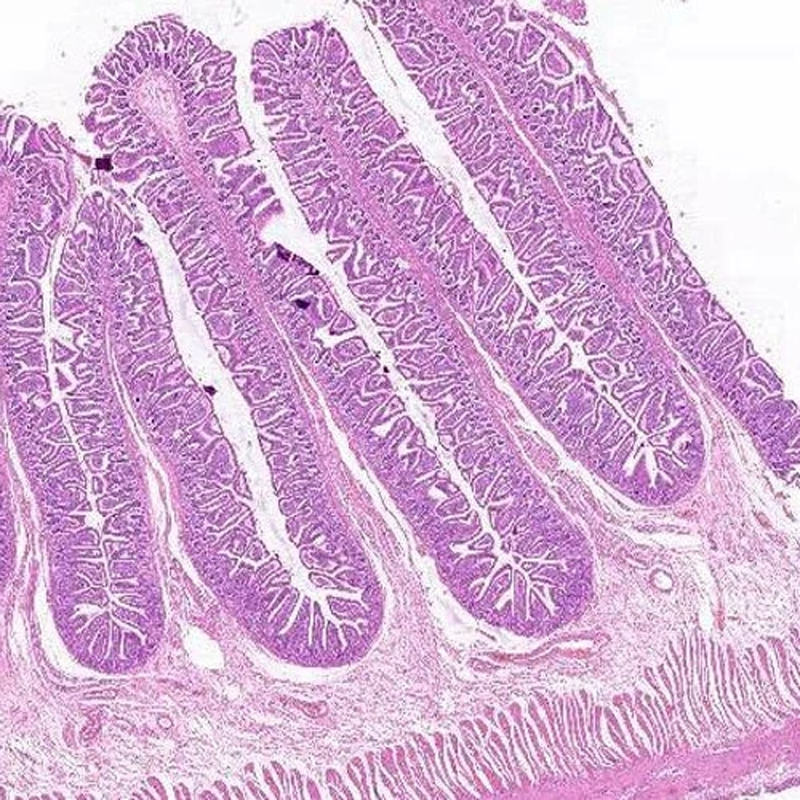


Physician's Assistant is analyzing histology...
----------------------------------------


Based on the provided histology image of the human small intestine, here is the analysis:

### 1. Identify the basic structures present in the view.
The image displays a cross-section of the small intestinal wall, showing its characteristic multi-layered architecture designed for digestion and absorption. The most prominent features are the numerous finger-like projections extending into the lumen and the distinct layers of tissue beneath them.

### 2. Distinguish between the different layers of the intestinal wall.
The image clearly shows four distinct layers, from the innermost (lumen-facing) to the outermost:

*   **Mucosa:** The innermost layer facing the top of the image. It consists of the epithelium lining the lumen, the underlying connective tissue (lamina propria), and a thin layer of smooth muscle at its base (muscularis mucosae, which forms the boundary with the submucosa). The mucosa is highly folded into villi and crypts.
*   **Submucosa:** Located immediately beneath the mucosa. It is a layer of dense irregular connective tissue that appears lighter pink and contains larger blood vessels and nerves.
*   **Muscularis Externa:** The thick, dark pink layer beneath the submucosa. It consists of two sub-layers of smooth muscle: an inner circular layer (appearing somewhat transversely cut here) and an outer longitudinal layer (appearing as cross-sections of muscle bundles).
*   **Serosa:** The very thin, outermost layer barely visible at the very bottom edge of the image. It consists of a thin layer of connective tissue covered by a simple squamous epithelium (mesothelium).

### 3. Point out specific cell types/structures.
Within the layers identified above, the following specific structures are visible:

*   **Villi (singular: Villus):** The large, finger-like projections of the mucosa that extend upwards. They are lined by a simple columnar epithelium.
*   **Crypts of Lieberkühn (Intestinal Glands):** The tubular, invaginated glands located at the base of the villi, dipping down into the lamina propria towards the submucosa.
*   **Enterocytes (Absorptive Cells):** The primary columnar epithelial cells that line the surface of the villi and crypts. They appear as a continuous purple layer on the outside of the villi.
*   **Goblet Cells:** Visible as empty-looking, pale or clear "bubble-like" shapes interspersed among the enterocytes in the epithelium. They are present on both the villi and in the crypts.
*   **Lamina Propria:** The loose connective tissue core that fills the center of each villus and surrounds the crypts. It appears lighter pink than the epithelial cells it supports.

### 4. Describe the basic function of each identified structure.
*   **Mucosa (General):** The primary site for digestion and absorption of nutrients.
    *   **Villi:** Vastly increase the surface area available for absorption.
    *   **Crypts of Lieberkühn:** The site of epithelial cell renewal (containing stem cells) and secretion of intestinal juice (water and electrolytes).
    *   **Enterocytes:** Responsible for the final digestion and absorption of nutrients (sugars, amino acids, fatty acids, water, electrolytes) from the lumen.
    *   **Goblet Cells:** Secrete mucus, which lubricates the passage of chyme and protects the intestinal lining from digestive enzymes.
    *   **Lamina Propria:** Provides structural support for the epithelium and contains the blood capillaries and lymphatic vessels (lacteals) that transport absorbed nutrients away from the intestine.
*   **Submucosa:** Supports the mucosa and contains larger blood vessels, lymphatics, and nerve networks (Meissner's plexus) that regulate mucosal secretions and blood flow.
*   **Muscularis Externa:** Responsible for gut motility, including peristalsis (propelling food forward) and segmentation (mixing food with digestive enzymes).
*   **Serosa:** Provides a protective outer coating and secretes serous fluid to reduce friction against other organs in the abdominal cavity.

### 5. Explain the tissue organization of the small intestine in the context of form and function (absorption and digestion).
The organization of the small intestine tissue is a classic example of "form follows function," specifically optimized for maximizing surface area for efficient absorption.

The **mucosa** is not flat; it is thrown into large folds (plicae circulares, not seen in this view) and covered in millions of **villi**. These villi, lined with absorptive **enterocytes** (which themselves have microvilli, forming a "brush border" not resolvable here), create an enormous surface area to ensure maximum contact with digested nutrients.

To maintain this high level of function, the epithelium turns over rapidly. The **crypts of Lieberkühn** house stem cells that continuously divide, pushing new cells up the villi to replace those shed at the tips. To protect this delicate absorptive surface from abrasion and self-digestion, **goblet cells** are interspersed throughout the epithelium to provide a protective mucus layer.

Finally, the absorbed nutrients need a transport system. The core of each villus, the **lamina propria**, is rich in capillaries to carry away amino acids and sugars, and a central lacteal (lymphatic capillary) to transport absorbed fats. The deeper muscular layers (**muscularis externa**) ensure that food is continuously mixed and moved along this highly specialized absorptive conveyor belt.

In [20]:
# Example 5B: Analyze the Image

import os
from PIL import Image
from google import genai
from google.colab import userdata
from IPython.display import display, Markdown

# 1. Setup Client (Global)
try:
    GOOGLE_API_KEY = userdata.get('GOOGLE_API_KEY')
    client = genai.Client(api_key=GOOGLE_API_KEY)
except Exception as e:
    print(f"Error checking API key: {e}")

# 2. Define the Detailed Prompt
eg_image_analysis_prompt = """
You are analyzing a histology image of a section of a healthy human small intestine wall.

Provide your analysis in the following format:
1. Identify the basic structures present in the view.
2. Distinguish between the different layers of the intestinal wall (Mucosa, Submucosa, Muscularis Externa, Serosa) if visible.
3. Point out specific cell types/structures such as Villi, Crypts of Lieberkühn, Goblet Cells, Enterocytes, and Lamina Propria.
4. Describe the basic function of each identified structure.
5. Explain the tissue organization of the small intestine in the context of form and function (absorption and digestion).

Histological Image Analysis Response:
"""

# 3. Define the image filename
eg_filename = "eg_medical_image.png"

def eg_analyze_histology(eg_filename):
    """
    Loads an image and sends it to Gemini with the specific histology prompt.
    """
    # Check file existence
    if not os.path.exists(eg_filename):
        print(f"Error: '{eg_filename}' not found.")
        return

    try:
        # Open the image using PIL
        img = Image.open(eg_filename)
        print(f"Loading image: {eg_filename}")
        display(img) # Display thumbnail

        print("\nPhysician's Assistant is analyzing histology...")

        # Send Request (Native SDK handles the image directly - no Base64 needed!)
        response = client.models.generate_content(
            model="nano-banana-pro-preview",
            contents=[eg_image_analysis_prompt, img]
        )

        # Display Result
        print("-" * 40)
        display(Markdown(response.text))

    except Exception as e:
        print(f"An error occurred: {e}")

# Run the analysis
eg_analyze_histology(eg_filename)


If the code is correct, you should see something _similar_ to the following output:

![__](https://biologicslab.co/BIO1173/images/class_04/class_04_1_image20F.png)
![__](https://biologicslab.co/BIO1173/images/class_04/class_04_1_image21F.png)


### **Exercise 5A: Download Image**

In the cell below, write the code to use Nano Banana Pro to analyze a clinical image called `ex_medical_image.png` that is stored on the course fileserver.



In [21]:
# Insert your code for Exercise 5A here

import requests
import os

# Define the URL and the filename you want to save it as
image_url = "https://biologicslab.co/BIO1173/images/class_04/ex_medical_image.png"
ex_filename = "ex_medical_image.png"

print(f"Attempting to download from: {image_url}")

try:
    # 1. Get the content from the URL
    response = requests.get(image_url)

    # 2. Check if the request was successful (Status Code 200)
    if response.status_code == 200:
        # 3. Write the content to a file in your Colab directory
        with open(ex_filename, 'wb') as f:
            f.write(response.content)
        print(f"✅ Success! Saved as '{ex_filename}' in current directory.")

        # Optional: Verify it exists by listing the directory
        if os.path.exists(ex_filename):
            print(f"File verified at: {os.path.abspath(ex_filename)}")

    else:
        print(f"❌ Failed to download. Status code: {response.status_code}")

except Exception as e:
    print(f"An error occurred: {e}")

Attempting to download from: https://biologicslab.co/BIO1173/images/class_04/ex_medical_image.png
✅ Success! Saved as 'ex_medical_image.png' in current directory.
File verified at: /content/ex_medical_image.png


If the code is correct, you should see the following output:

![__](https://biologicslab.co/BIO1173/images/class_04/class_04_1_image13F.png)


### **Exercise 5B: Image Analysis**

Write the code to send your image to Nano Banana Pro for analysis.

**Code Hints:**

Use this prompt:
```python
# 2. Define the Detailed Prompt
ex_image_analysis_prompt = """
You are analyzing a histology image of a section of a healthy human kidney.

Provide your analysis in the following format:
1. Identify the basic structures present in the view.
2. Distinguish between the Cortex and Medulla if visible.
3. Point out specific cell types/structures such as Glomeruli, Proximal/Distal Tubules, and Collecting Ducts.
4. Describe the basic function of each identified structure.
5. Explain the tissue organization of the kidney in the context of form and function (filtration and reabsorption).

Histological Image Analysis Response:
"""

```

Loading image: ex_medical_image.png


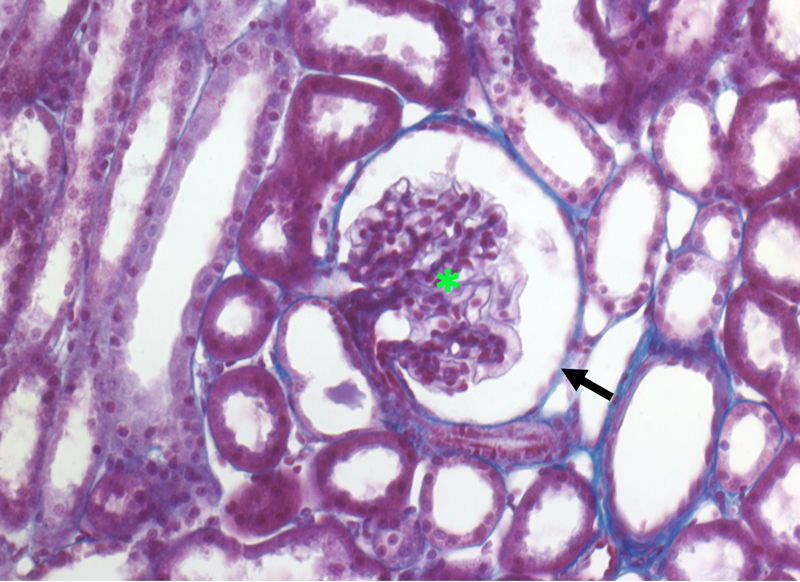


Physician's Assistant is analyzing histology...
----------------------------------------


Based on the provided histological image of a healthy human kidney, here is the analysis:

### 1. Basic Structures Present
The view presents a high-magnification micrograph of kidney tissue. The prominent features are a renal corpuscle (composed of a glomerulus and Bowman's capsule) and numerous surrounding renal tubules, all embedded in a sparse interstitium.

### 2. Distinction between Cortex and Medulla
This image shows a section of the **renal cortex**. The presence of a **renal corpuscle** (the spherical structure containing the glomerulus) is the definitive identifier for the cortex, as these structures are absent in the renal medulla.

### 3. Identification of Specific Structures
*   **Glomerulus:** The structure marked with the **green asterisk (*)** is the **glomerulus**. It is a tangled cluster of specialized blood capillaries.
*   **Bowman's Capsule:** The structure indicated by the **black arrow** is the **parietal layer of Bowman's capsule**. This layer consists of simple squamous epithelium and forms the outer wall of the chamber that encloses the glomerulus. The clear space between the glomerulus and this parietal layer is the **Bowman's space** (or urinary space).
*   **Renal Tubules:** The structures surrounding the renal corpuscle are cross-sections of renal tubules. Based on their appearance—large cuboidal cells, intensely staining cytoplasm, and somewhat indistinct "fuzzy" lumens (due to a brush border)—most of these are **proximal convoluted tubules (PCTs)**.

### 4. Basic Function of Each Structure
*   **Glomerulus:** Its primary function is the **filtration of blood**. Under pressure, plasma and small solutes are forced out of the glomerular capillaries and into Bowman's space, forming the glomerular filtrate.
*   **Bowman's Capsule:** It serves to **collect the filtrate** coming from the glomerulus and funnels it into the proximal convoluted tubule.
*   **Proximal Convoluted Tubules (PCTs):** These tubules are the major site for **reabsorption**. They reabsorb approximately two-thirds of the filtered water and sodium, and virtually all nutrients like glucose and amino acids, returning them to the blood.

### 5. Tissue Organization in Context of Form and Function
The organization of the kidney tissue is perfectly adapted for its role in filtering blood and processing the filtrate into urine.

*   **Filtration:** The renal corpuscles in the cortex are the sites of initial blood filtration. The unique structure of the glomerular capillary walls (with fenestrations) and the podocytes (visceral layer of Bowman's capsule, not explicitly pointed out but covering the capillaries) creates a highly selective **filtration membrane**. This membrane allows water and small solutes to pass while holding back larger molecules like proteins and cells.
*   **Reabsorption:** The resulting filtrate then flows through the tubule system. The **proximal tubules** are highly specialized for massive reabsorption. Their cells are large, packed with mitochondria to provide energy for active transport, and possess a dense microvillus (brush) border on their luminal surface, vastly increasing the surface area available for reabsorbing essential substances from the filtrate. The tubules are closely associated with a network of peritubular capillaries (not clearly distinguished in this stain), allowing reabsorbed materials to quickly re-enter the bloodstream. This sequential processing along the nephron ensures that the body retains necessary water and solutes while eliminating waste products.

In [23]:
# Insert your code for Exercise 5B here

import os
from PIL import Image
from google import genai
from google.colab import userdata
from IPython.display import display, Markdown

# 1. Setup Client (Global)
try:
    GOOGLE_API_KEY = userdata.get('GOOGLE_API_KEY')
    client = genai.Client(api_key=GOOGLE_API_KEY)
except Exception as e:
    print(f"Error checking API key: {e}")

# 2. Define the Detailed Prompt
ex_image_analysis_prompt = """
You are analyzing a histology image of a section of a healthy human kidney.

Provide your analysis in the following format:
1. Identify the basic structures present in the view.
2. Distinguish between the Cortex and Medulla if visible.
3. Point out specific cell types/structures such as Glomeruli, Proximal/Distal Tubules, and Collecting Ducts.
4. Describe the basic function of each identified structure.
5. Explain the tissue organization of the kidney in the context of form and function (filtration and reabsorption).

Histological Image Analysis Response:
"""

def ex_analyze_histology(ex_filename):
    """
    Loads an image and sends it to Gemini with the specific histology prompt.
    """
    # Check file existence
    if not os.path.exists(ex_filename):
        print(f"Error: '{ex_filename}' not found.")
        return

    try:
        # Open the image using PIL
        img = Image.open(ex_filename)
        print(f"Loading image: {ex_filename}")
        display(img) # Display thumbnail

        print("\nPhysician's Assistant is analyzing histology...")

        # Send Request (Native SDK handles the image directly - no Base64 needed!)
        response = client.models.generate_content(
            model="nano-banana-pro-preview",
            contents=[ex_image_analysis_prompt, img]
        )

        # Display Result
        print("-" * 40)
        display(Markdown(response.text))

    except Exception as e:
        print(f"An error occurred: {e}")

# Run the analysis
ex_analyze_histology(ex_filename)

If the code is correct, you should see something _similar_ to the following output:

![__](https://biologicslab.co/BIO1173/images/class_04/class_04_1_image15F.png)
![__](https://biologicslab.co/BIO1173/images/class_04/class_04_1_image16F.png)


Play this YouTube video to learn more about Nano Banana Pro and its ability to generate **infographics**.

In [ ]:
from IPython.display import HTML
video_id = "hbfrZriq0f8?si=OFa081eI_qsGUBSn"
HTML(f"""
<iframe width="560" height="315"
  src="https://www.youtube.com/embed/{video_id}"
  title="YouTube video player"
  frameborder="0"
  allow="accelerometer; autoplay; clipboard-write; encrypted-media; gyroscope; picture-in-picture"
  allowfullscreen
  referrerpolicy="strict-origin-when-cross-origin">
</iframe>
""")

## **What is an Infographic?**

An **infographic** (information graphic) is a visual representation of information, data, or knowledge intended to present complex information quickly and clearly. It combines imagery, charts, and minimal text to tell a story or explain a process.

#### **Why are Infographics Useful for Technical Research?**

In the context of scientific publishing and education, infographics (often called **Visual Abstracts**) serve several critical functions:

* **Rapid Comprehension:** The human brain processes visuals 60,000 times faster than text. An infographic allows a reader to understand the core findings of a paper in seconds rather than minutes.
* **Simplification of Complexity:** Technical papers often contain dense jargon and complex methodologies. An infographic forces the author to distill this down to the most essential "take-home" message.
* **Visualizing Workflows:** For studies involving multi-step processes (like the *GUARDIAN* study's screening workflow or the *Neuron-Cancer* mechanism), a flowchart is often clearer than a text description.
* **Broader Accessibility:** Visual summaries make high-level research accessible to students, the media, and the general public, effectively bridging the gap between academia and the real world.
* **Increased Citations:** Studies suggest that research papers promoted with visual abstracts on social media receive significantly more engagement and citations than those without.

### Example 6: Create an Infographic from a Research Article

For Example 6 we are going to use Google's `Nano Banana Pro` to generate an infographic for a recently published scientific research article. This example has been divided into two steps to make the code easier to follow.

### Example 6A: Generate Summary of the Research Paper

In the first step, we will download the research paper, "NerverCancerTransfer.pdf" from the course file server. We will then upload it to Nano Banana Pro so it can "read" the paper and generate a summary of the paper's contents. In the next step, we will let Nano Banana Pro use this summary to construct an infographic.

In [24]:
# Example 6A: Generate Summary of the Research Paper

import requests
import os
from google import genai
from google.colab import userdata
from IPython.display import display, Markdown

# Define name of the research paper
RESEARCH_PAPER="NerveCancerTransfer.pdf"

# 1. Setup Client
try:
    GOOGLE_API_KEY = userdata.get('GOOGLE_API_KEY')
    client = genai.Client(api_key=GOOGLE_API_KEY)
    print("API client initialized successfully!")
except Exception as e:
    print(f"Error setting up API client: {e}")

# 2. Download research paper from fileserver
pdf_url = "https://biologicslab.co/BIO1173/images/class_04/NerveCancerTransfer.pdf"
eg_pdf_filename = "NerveCancerTransfer.pdf"

# Download PDF (Silent if already exists)
if not os.path.exists(eg_pdf_filename):
    try:
        r = requests.get(pdf_url)
        with open(eg_pdf_filename, 'wb') as f: f.write(r.content)
    except: pass

# 3. Upload the PDF to Gemini
print(f"Uploading {eg_pdf_filename} to Gemini...", end="")
uploaded_file = client.files.upload(file=eg_pdf_filename)
print("done.")
print(f"Upload complete: {uploaded_file.name}")

# 4. Define the summary prompt
summary_prompt = """
Read this research paper and provide a detailed summary focusing on:

1. What is this study?
2. What is its main purpose?
3. What are the key findings or outcomes?

Keep the summary under 1500 words but include all key details needed to create
an accurate infographic about this specific study.
"""

# 5. Generate summary using Gemini
print("Analyzing your research paper...",end="")
eg_summary_response = client.models.generate_content(
    model="nano-banana-pro-preview",
    contents=[uploaded_file, summary_prompt]
)

print("done.")

# 6. Print Summary (optional)
eg_paper_summary = eg_summary_response.text
# Uncomment next lines to print out research summary
# print("\nPaper Summary:")
# print("-" * 40)
# display(Markdown(paper_summary))


API client initialized successfully!
Uploading NerveCancerTransfer.pdf to Gemini...done.
Upload complete: files/v61rv90pbmob
Analyzing your research paper...done.


If the code is correct, you should see the following output:

![__](https://biologicslab.co/BIO1173/images/class_04/class_04_1_image32F.png)

### Example 6B: Generate Infographic Summary

Now that we have a detailed summary of our research paper, we can let Nano Banana Pro read the summary and based on what it finds, generate an infographic that provides a visual summary the research paper.

Generating infographic based on the uploaded research article...
(This may take 30-60 seconds)

Generated Infographic:
----------------------------------------


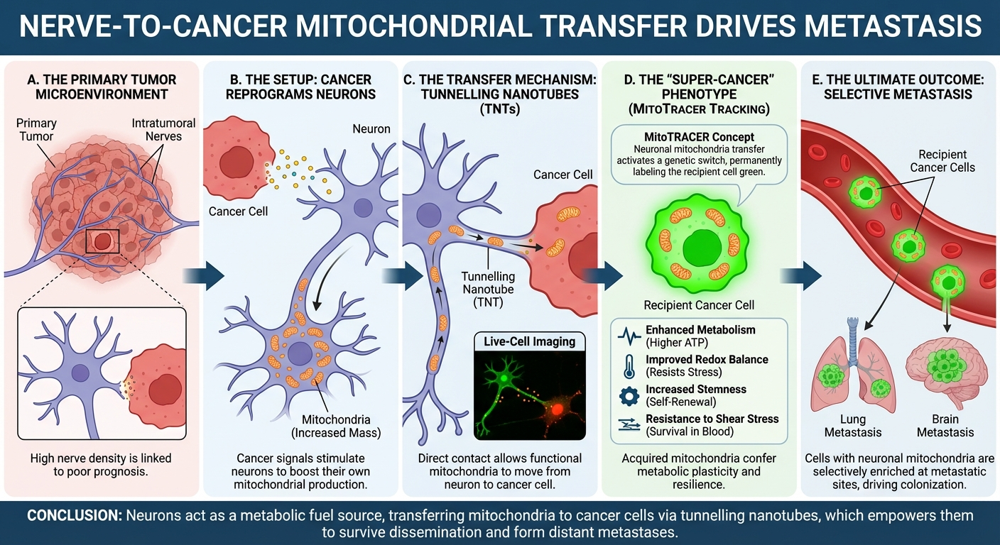


Saved as: eg_infographic.png


In [25]:
# Example 6B: Generate Infographic Summary

import os
import io
import base64
from PIL import Image
from IPython.display import display

# 1. Define the Infographic Prompt (let Nano Banana Pro decide the content)
infographic_prompt = f"""
You are a scientific illustrator. Read the following research paper summary and
create an educational infographic that best represents the key concepts and workflow
described in the paper.

RESEARCH PAPER SUMMARY:
{eg_paper_summary}

Create a clear, visually appealing educational infographic based on this research paper.
Include appropriate labels and text to explain the key steps or concepts.

Style: Clean, modern scientific illustration suitable for a biology textbook.
"""

# 2. Define the output filename
eg_output_filename = "eg_infographic.png"

def eg_generate_infographic(prompt, output_file):
    """
    Generates an infographic using Nano Banana Pro.
    """
    try:
        print("Generating infographic based on the uploaded research article...")
        print("(This may take 30-60 seconds)\n")

        # Send request to Gemini Image Generation
        response = client.models.generate_content(
            model="nano-banana-pro-preview",
            contents=prompt,
            config={
                "response_modalities": ["image", "text"],
            }
        )

        # Extract and save the image
        for part in response.candidates[0].content.parts:
            if hasattr(part, 'inline_data') and part.inline_data:
                # Get the raw image bytes
                image_bytes = part.inline_data.data

                # Check if it's already bytes or needs decoding
                if isinstance(image_bytes, str):
                    image_bytes = base64.b64decode(image_bytes)

                if len(image_bytes) < 100:
                    print("Error: Received empty/broken image bytes.")
                    return None

                # Open image from bytes
                image = Image.open(io.BytesIO(image_bytes))

                # Display the image
                print("Generated Infographic:")
                print("-" * 40)
                display(image)

                # Save the image
                image.save(output_file)
                print(f"\nSaved as: {output_file}")
                return image

        print("No image was generated in the response.")
        return None

    except Exception as e:
        print(f"An error occurred: {e}")
        import traceback
        traceback.print_exc()
        return None

# Run the infographic generation
infographic = eg_generate_infographic(infographic_prompt, eg_output_filename)


If the code is correct, you should see something _similar_ to the following output:

![__](https://biologicslab.co/BIO1173/images/class_04/class_04_1_image33F.png)

### **Exercise 6A: Generate Summary of the Research Paper**

For **Exericse 6A** you are to write the code to generate a summary of a different research article called "GUARDIAN_study.pdf" that is also available on the course file server.

**Code Hints:**

Change the prefix `eg_` to `ex_`.

In [26]:
# Insert your code for Exercise 6A here

import requests
import os
from google import genai
from google.colab import userdata
from IPython.display import display, Markdown

# Define name of the research paper
RESEARCH_PAPER="GUARDIAN_study.pdf"

# 1. Setup Client
try:
    GOOGLE_API_KEY = userdata.get('GOOGLE_API_KEY')
    client = genai.Client(api_key=GOOGLE_API_KEY)
    print("API client initialized successfully!")
except Exception as e:
    print(f"Error setting up API client: {e}")

# 3. Download research paper from fileserver
pdf_url = "https://biologicslab.co/BIO1173/images/class_04/GUARDIAN_study.pdf"
ex_pdf_filename = "GUARDIAN_study.pdf"

# Download PDF (Silent if already exists)
if not os.path.exists(ex_pdf_filename):
    try:
        r = requests.get(pdf_url)
        with open(ex_pdf_filename, 'wb') as f: f.write(r.content)
    except: pass

# 4. Upload the PDF to Gemini
print(f"Uploading {ex_pdf_filename} to Gemini...", end="")
uploaded_file = client.files.upload(file=ex_pdf_filename)
print("done.")
print(f"Upload complete: {uploaded_file.name}")

# 5. Define the summary prompt
summary_prompt = """
Read this research paper and provide a detailed summary focusing on:

1. What is this study?
2. What is its main purpose?
3. What are the key findings or outcomes?

Keep the summary under 1500 words but include all key details needed to create
an accurate infographic about this specific study.
"""

# 4. Generate summary using Gemini
print("Analyzing your research paper...",end="")
ex_summary_response = client.models.generate_content(
    model="nano-banana-pro-preview",
    contents=[uploaded_file, summary_prompt]
)

print("done.")

# 6. Generate Summary
ex_paper_summary = ex_summary_response.text
# Uncomment next lines to print out research summary
# print("\nPaper Summary:")
# print("-" * 40)
# display(Markdown(paper_summary))


API client initialized successfully!
Uploading GUARDIAN_study.pdf to Gemini...done.
Upload complete: files/s4fkwesmuor2
Analyzing your research paper...done.


If the code is correct, you should see xomethong _similar_ to the following output:

![__](https://biologicslab.co/BIO1173/images/class_04/class_04_1_image34F.png)

### **Exercise 6B: Generate Infographic**

In the next code cell write the Python code to use Nano Banana Pro to generate an infographic based on the summary you created in the previous step (**Exercise 6A**).

Generating infographic based on the uploaded research article...
(This may take 30-60 seconds)

Generated Infographic:
----------------------------------------


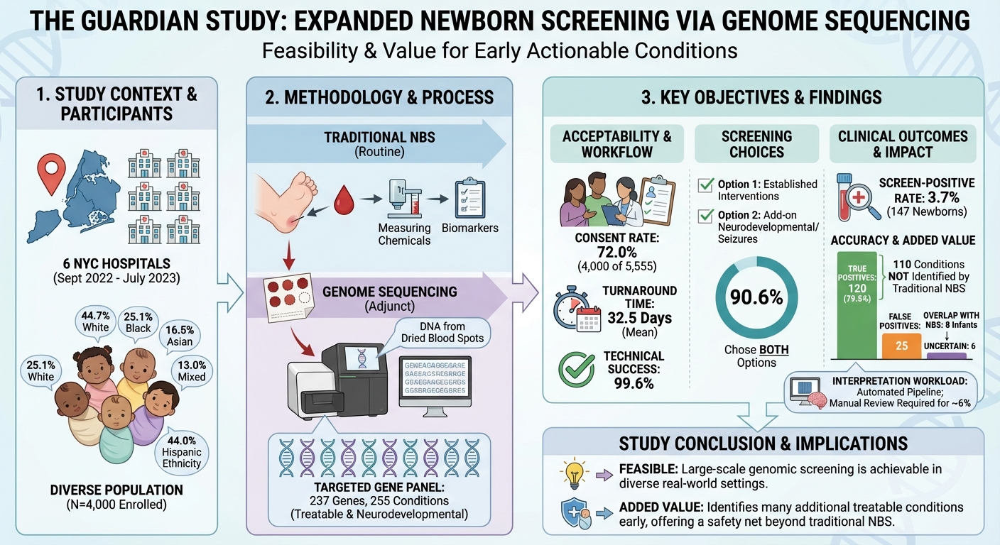


Saved as: ex_infographic.png


In [27]:
# Insert your code for Exercise 6B here

import os
import io
import base64
from PIL import Image
from IPython.display import display

# 1. Define the Infographic Prompt (let Nano Banana Pro decide the content)
infographic_prompt = f"""
You are a scientific illustrator. Read the following research paper summary and
create an educational infographic that best represents the key concepts and workflow
described in the paper.

RESEARCH PAPER SUMMARY:
{ex_paper_summary}

Create a clear, visually appealing educational infographic based on this research paper.
Include appropriate labels and text to explain the key steps or concepts.

Style: Clean, modern scientific illustration suitable for a biology textbook.
"""

# 2. Define the output filename
ex_output_filename = "ex_infographic.png"

def ex_generate_infographic(prompt, output_file):
    """
    Generates an infographic using Nano Banana Pro.
    """
    try:
        print("Generating infographic based on the uploaded research article...")
        print("(This may take 30-60 seconds)\n")

        # Send request to Gemini Image Generation
        response = client.models.generate_content(
            model="nano-banana-pro-preview",
            contents=prompt,
            config={
                "response_modalities": ["image", "text"],
            }
        )

        # Extract and save the image
        for part in response.candidates[0].content.parts:
            if hasattr(part, 'inline_data') and part.inline_data:
                # Get the raw image bytes
                image_bytes = part.inline_data.data

                # Check if it's already bytes or needs decoding
                if isinstance(image_bytes, str):
                    image_bytes = base64.b64decode(image_bytes)

                if len(image_bytes) < 100:
                    print("Error: Received empty/broken image bytes.")
                    return None

                # Open image from bytes
                image = Image.open(io.BytesIO(image_bytes))

                # Display the image
                print("Generated Infographic:")
                print("-" * 40)
                display(image)

                # Save the image
                image.save(output_file)
                print(f"\nSaved as: {output_file}")
                return image

        print("No image was generated in the response.")
        return None

    except Exception as e:
        print(f"An error occurred: {e}")
        import traceback
        traceback.print_exc()
        return None

# Run the infographic generation
infographic = ex_generate_infographic(infographic_prompt, ex_output_filename)


If the code is correct, you should see something _similar_ to the following output:

![__](https://biologicslab.co/BIO1173/images/class_04/class_04_1_image36F.png)

## **Turning Photos into Cartoon Images**

In this part of this lesson we demonstrate how to convert a photorealtistic image into a cartoon image.

### **Why Convert a Photorealistic Image into a Cartoon Image?**

Converting a photorealistic image into a cartoon image can serve a variety of creative, practical, and communicative purposes. Here are some common reasons:

#### **1. Artistic Expression**
- Stylizes images to emphasize features or emotions.
- Transforms mundane photos into engaging artwork.

#### **2. Branding and Marketing**
- Cartoon images are memorable and approachable.
- Ideal for logos, mascots, and promotional materials.

#### **3. Social Media and Content Creation**
- Popular for avatars, thumbnails, and storytelling.
- Helps creators stand out with a consistent visual identity.

#### **4. Privacy and Anonymity**
- Obscures identities while retaining personality.
- Useful for online profiles and public presentations.

#### **5. Educational and Instructional Use**
- Simplified visuals make complex subjects more accessible.
- Common in infographics, children’s books, and tutorials.

#### **6. Entertainment and Media**
- Widely used in animation, comics, and video games.
- Enables exaggerated expressions and imaginative scenarios.


### Example 7: Create Cartoon Image from Photograph

The code in the cell below demonstrates how to turn an actual image of two women working in a biology lab into a cartoon‑style image using Nano Banana Pro.

By altering the prompt, you can achieve different cartoon effects.

#### **Here are the Top 3 Cartoon Styles:**

**1. The "Disney / Pixar" 3D Style**
Best for: Making people or pets look friendly and expressive.

```text
Prompt:

A cute 3D rendered character in the style of a
modern Pixar movie. Big expressive eyes, soft smooth lighting,
vibrant colors, 4k resolution, 3D blender render.
Style: Disney/Pixar 3D render

```

**2. The "Anime / Manga" Style**
Best for: Action shots or dramatic portraits.

```text
Prompt:

High-quality anime style illustration,
Studio Ghibli art style. cel-shaded, vibrant colors,
clean lines, highly detailed background.
Style: Anime Manga

```

**3. The "Flat Vector" Style (Great for Presentations)**
Best for: Icons, symbols, or professional graphics

```text
Prompt:

Flat vector art illustration, minimal design,
bold solid colors, no gradients, white background,
thick black outlines.
Style: Flat Vector

```

The example in the cell below, uses the **Anime/Manga Style**.

API client initialized successfully!
Downloaded: BioLab2.jpg (252.79 KB)
Loading BioLab2.jpg...
Image size: (813, 813)
Original Image:


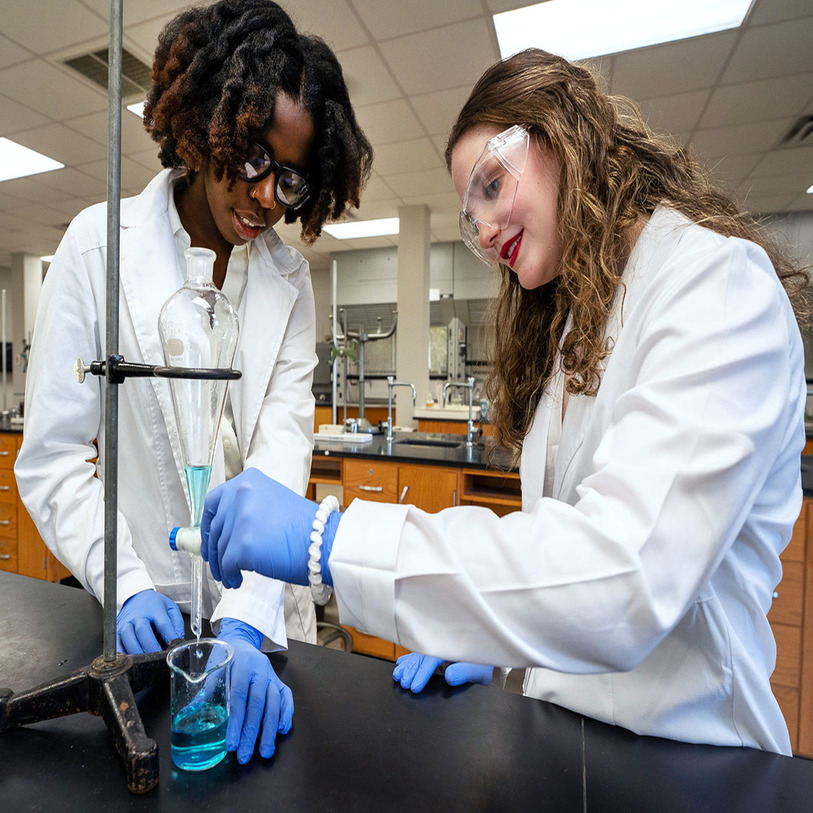

Generating cartoon version of the image...
(This may take 30-60 seconds)

Generated Cartoon Image:
----------------------------------------


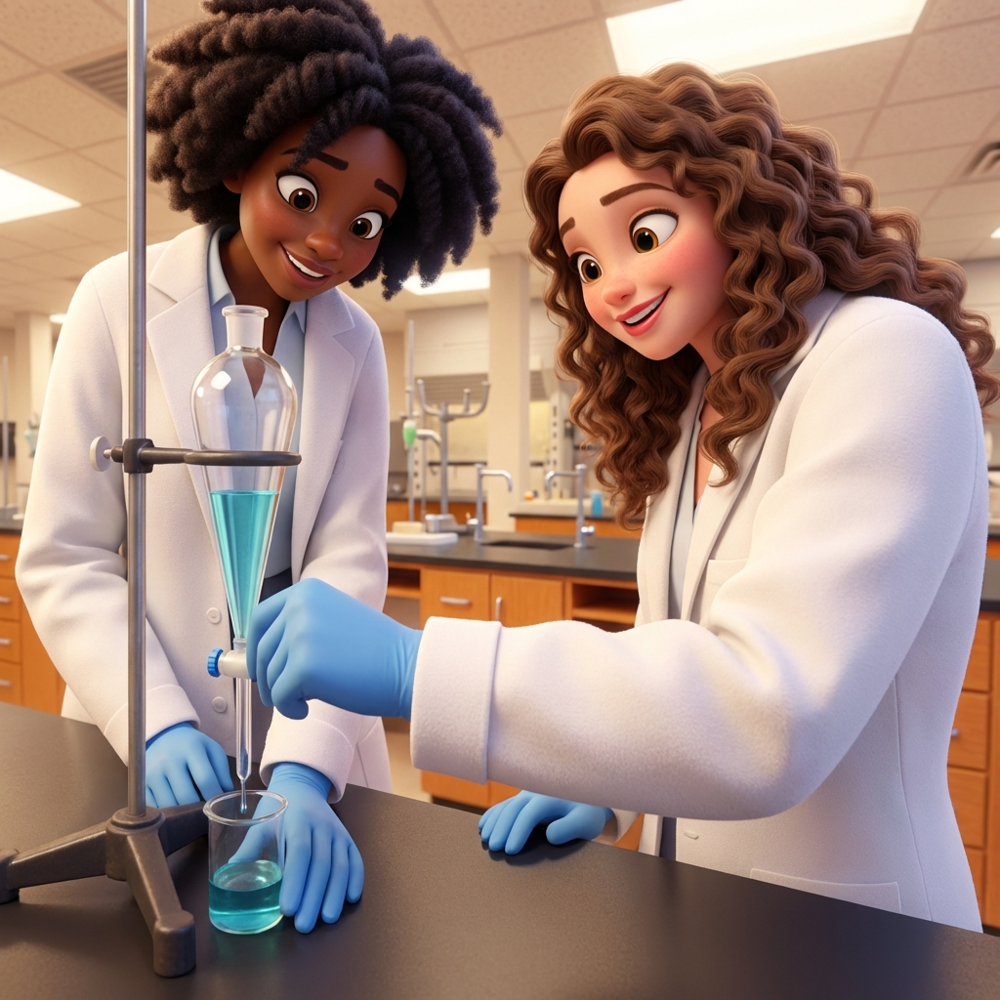


Saved as: eg_cartoon_image.png


In [28]:
# Example 7: Generate a Cartoon Image

import os
import io
import base64
from PIL import Image
import requests
from google import genai
from google.colab import userdata
from IPython.display import display

# Define name of the original photo
ORIGINAL_PHOTO = "BioLab2.jpg"

# 1. Setup Client
try:
    GOOGLE_API_KEY = userdata.get('GOOGLE_API_KEY')
    client = genai.Client(api_key=GOOGLE_API_KEY)
    print("API client initialized successfully!")
except Exception as e:
    print(f"Error setting up API client: {e}")

# 2. Download photo from fileserver
image_url = "https://biologicslab.co/BIO1173/images/class_04/BioLab2.jpg"

# Download file
try:
    print(f"Downloading from: {image_url}")
    r = requests.get(image_url, timeout=30)

    if r.status_code == 200:
        with open(ORIGINAL_PHOTO, 'wb') as f:
            f.write(r.content)
        file_size = len(r.content) / 1024
        print(f"Downloaded: {ORIGINAL_PHOTO} ({file_size:.2f} KB)")
    else:
        print(f"Download failed. Status code: {r.status_code}")

except Exception as e:
    print(f"Download error: {e}")

# 3. Load the image with PIL
print(f"Loading {ORIGINAL_PHOTO}...")
original_image = Image.open(ORIGINAL_PHOTO)
print(f"Image size: {original_image.size}")
print("Original Image:")
display(original_image)

# 4. Define the cartoon prompt
eg_cartoon_prompt = """
Generate a 3D Pixar-style cartoon version of this image.
Focus on big expressive eyes and soft, fluffy fur texture.
Bright, happy lighting.
Style: Disney/Pixar 3D render.
"""

# 5. Define the output filename
eg_output_filename = "eg_cartoon_image.png"

def eg_generate_cartoon(image, prompt, output_file):
    """
    Generates a cartoon version of an image using Nano Banana Pro.
    """
    try:
        print("Generating cartoon version of the image...")
        print("(This may take 30-60 seconds)\n")

        # Send request to Gemini Image Generation with the PIL image directly
        response = client.models.generate_content(
            model="nano-banana-pro-preview",
            contents=[image, prompt],
            config={
                "response_modalities": ["image", "text"],
            }
        )

        # Extract and save the image
        for part in response.candidates[0].content.parts:
            if hasattr(part, 'inline_data') and part.inline_data:
                # Get the raw image bytes
                image_bytes = part.inline_data.data

                # Check if it's already bytes or needs decoding
                if isinstance(image_bytes, str):
                    image_bytes = base64.b64decode(image_bytes)

                if len(image_bytes) < 100:
                    print("Error: Received empty/broken image bytes.")
                    return None

                # Open image from bytes
                result_image = Image.open(io.BytesIO(image_bytes))

                # Display the image
                print("Generated Cartoon Image:")
                print("-" * 40)
                display(result_image)

                # Save the image
                result_image.save(output_file)
                print(f"\nSaved as: {output_file}")
                return result_image

        print("No image was generated in the response.")
        return None

    except Exception as e:
        print(f"An error occurred: {e}")
        import traceback
        traceback.print_exc()
        return None

# Run the cartoon generation (pass the PIL image directly)
eg_cartoon_image = eg_generate_cartoon(original_image, eg_cartoon_prompt, eg_output_filename)


If the code is correct, you should see something _similar_ to the following output:

![__](https://biologicslab.co/BIO1173/images/class_04/class_04_1_image38F.png)
![__](https://biologicslab.co/BIO1173/images/class_04/class_04_1_image39F.png)

### **Exercise 7: Create Cartoon Image from Photograph**

In the cell below, write the code to create a cartoon image from the same photograph used in Example 7, but change the cartoon style to either **Anime/Manga Style** or **Flat Vector Style**.

**Code Hints:**

Copy-and-paste the code from Example 7 into the cell below. Modify the prompt to change the style using the prompt examples cited in Example 7.

API client initialized successfully!
Downloaded: BioLab2.jpg (252.79 KB)
Loading BioLab2.jpg...
Image size: (813, 813)
Original Image:


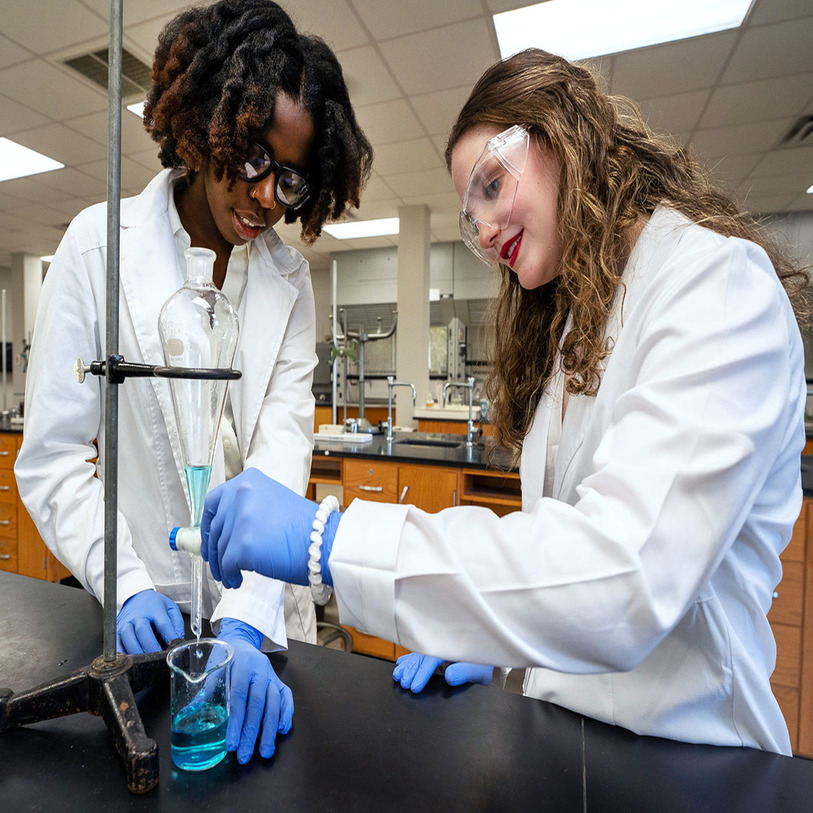

Generating cartoon version of the image...
(This may take 30-60 seconds)

Generated Cartoon Image:
----------------------------------------


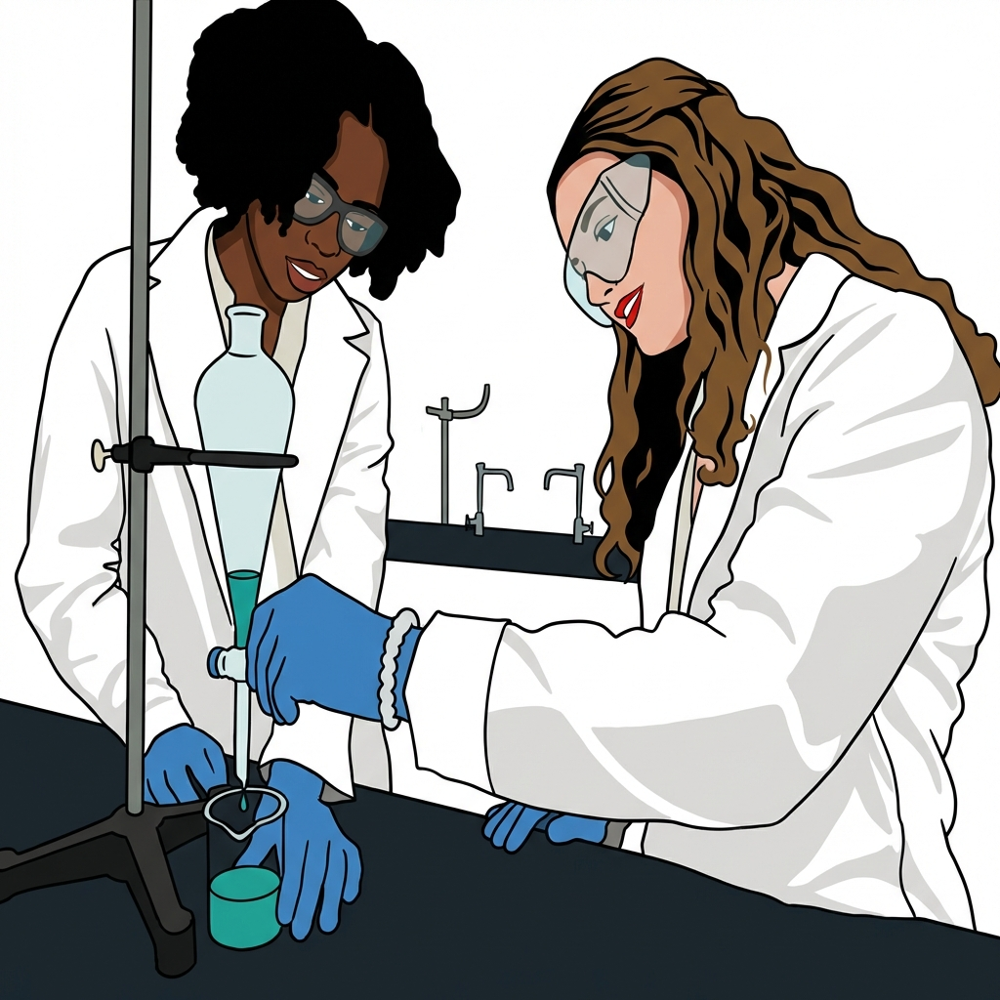


Saved as: ex_cartoon_image.png


In [29]:
# Insert your code for Exercise 7 here

import os
import io
import base64
from PIL import Image
import requests
from google import genai
from google.colab import userdata
from IPython.display import display

# Define name of the original photo
ORIGINAL_PHOTO = "BioLab2.jpg"

# 1. Setup Client
try:
    GOOGLE_API_KEY = userdata.get('GOOGLE_API_KEY')
    client = genai.Client(api_key=GOOGLE_API_KEY)
    print("API client initialized successfully!")
except Exception as e:
    print(f"Error setting up API client: {e}")

# 2. Download photo from fileserver
image_url = "https://biologicslab.co/BIO1173/images/class_04/BioLab2.jpg"

# Download file
try:
    print(f"Downloading from: {image_url}")
    r = requests.get(image_url, timeout=30)

    if r.status_code == 200:
        with open(ORIGINAL_PHOTO, 'wb') as f:
            f.write(r.content)
        file_size = len(r.content) / 1024
        print(f"Downloaded: {ORIGINAL_PHOTO} ({file_size:.2f} KB)")
    else:
        print(f"Download failed. Status code: {r.status_code}")

except Exception as e:
    print(f"Download error: {e}")

# 3. Load the image with PIL
print(f"Loading {ORIGINAL_PHOTO}...")
original_image = Image.open(ORIGINAL_PHOTO)
print(f"Image size: {original_image.size}")
print("Original Image:")
display(original_image)

# 4. Define the cartoon prompt
ex_cartoon_prompt = """
Flat vector art illustration, minimal design,
bold solid colors, no gradients, white background,
thick black outlines.
Style: Flat Vector
"""

# 5. Define the output filename
ex_output_filename = "ex_cartoon_image.png"

def ex_generate_cartoon(image, prompt, output_file):
    """
    Generates a cartoon version of an image using Nano Banana Pro.
    """
    try:
        print("Generating cartoon version of the image...")
        print("(This may take 30-60 seconds)\n")

        # Send request to Gemini Image Generation with the PIL image directly
        response = client.models.generate_content(
            model="nano-banana-pro-preview",
            contents=[image, prompt],
            config={
                "response_modalities": ["image", "text"],
            }
        )

        # Extract and save the image
        for part in response.candidates[0].content.parts:
            if hasattr(part, 'inline_data') and part.inline_data:
                # Get the raw image bytes
                image_bytes = part.inline_data.data

                # Check if it's already bytes or needs decoding
                if isinstance(image_bytes, str):
                    image_bytes = base64.b64decode(image_bytes)

                if len(image_bytes) < 100:
                    print("Error: Received empty/broken image bytes.")
                    return None

                # Open image from bytes
                result_image = Image.open(io.BytesIO(image_bytes))

                # Display the image
                print("Generated Cartoon Image:")
                print("-" * 40)
                display(result_image)

                # Save the image
                result_image.save(output_file)
                print(f"\nSaved as: {output_file}")
                return result_image

        print("No image was generated in the response.")
        return None

    except Exception as e:
        print(f"An error occurred: {e}")
        import traceback
        traceback.print_exc()
        return None

# Run the cartoon generation (pass the PIL image directly)
ex_cartoon_image = ex_generate_cartoon(original_image, ex_cartoon_prompt, ex_output_filename)


Your output will depend upon the cartoon style you selected for **Exercise 7**

## **Embedding Layers in PyTorch**

[Embedding Layers](https://pytorch.org/docs/stable/generated/torch.nn.Embedding.html) are a handy feature of PyTorch that allows the program to automatically insert additional information into the data flow of your neural network. An embedding layer would automatically allow you to insert vectors in the place of word indexes.  

Programmers often use embedding layers with Natural Language Processing (NLP); however, you can use these layers when you wish to insert a lengthier vector in an index value place. In some ways, you can think of an embedding layer as dimension expansion. However, the hope is that these additional dimensions provide more information to the model and provide a better score.

For this demonstration of Embedding Layer, we are break the code into 3 blocks (steps).

## Overview: Learning Medical Term Embeddings with Neural Networks

This code demonstrates a fundamental concept in modern AI and natural language processing: **word embeddings**. Embeddings are numerical representations of words (or concepts) that capture semantic relationships in a way that computers can process and learn from.

### What Are Embeddings?

In traditional computing, words are just strings of characters with no inherent meaning. The word "heart" has no mathematical relationship to "lung" or "kidney." However, in medicine and biology, we know these terms are semantically related—they're all organs in the human body.

**Embeddings solve this problem** by representing each word as a vector (a list of numbers) in a multi-dimensional space. Words with similar meanings or relationships end up close together in this space, while unrelated words are far apart.

### What This Code Does

#### Step 1: Define the Medical Vocabulary
The code creates a list of 22 common medical terms including organs (heart, lung, kidney, liver, brain), body components (bone, muscle, skin, blood, nerve), pathogens (virus, bacteria), and medical conditions (infection, fever, diabetes, hypertension, stroke, cancer, allergy).

#### Step 2: Create the Embedding Layer
Using PyTorch, the code creates an **embedding layer** that will learn to represent each of the 22 medical terms as a 6-dimensional vector. Initially, these vectors are random numbers with no meaningful relationships.

```python
embedding_layer = nn.Embedding(num_embeddings=22, embedding_dim=6)


In [32]:
# Embedding Example - Step 1

import torch
import torch.nn as nn
import torch.optim as optim
import numpy as np
import matplotlib.pyplot as plt
from sklearn.decomposition import PCA
from sklearn.metrics.pairwise import cosine_similarity
import textwrap
WIDTH = 80  # Adjust the width to fit your Colab notebook


# Create a medical vocabulary (common terms in medicine)
medical_terms = [
    'heart', 'lung', 'kidney', 'liver', 'brain', 'stomach',
    'bone', 'muscle', 'skin', 'blood', 'nerve', 'virus',
    'bacteria', 'infection', 'fever', 'pain', 'diabetes',
    'hypertension', 'stroke', 'cancer', 'allergy', 'immune'
]

print(f"Medical vocabulary: {len(medical_terms)} terms")
wrapped_text = textwrap.fill(f"Medical terms: {medical_terms}", width=WIDTH)
print(wrapped_text)

# Create embedding layer - learning representations of medical terms
embedding_layer = nn.Embedding(num_embeddings=len(medical_terms), embedding_dim=6)
optimizer = optim.Adam(embedding_layer.parameters(), lr=0.01)
loss_function = nn.MSELoss()

# Define some semantic relationships (in real scenarios, this would come from data)
training_pairs = [
    # (term1_index, term2_index) - terms that are anatomically related
    (0, 6),  # heart vs bone
    (1, 7),  # lung vs muscle
    (2, 8),  # kidney vs skin
    (3, 9),  # liver vs blood
    (4, 10), # brain vs nerve
    (11, 12), # virus vs bacteria
    (13, 14), # infection vs fever
    (15, 16), # pain vs diabetes
    (17, 18), # hypertension vs stroke
    (19, 20), # cancer vs allergy
]

# Create target embeddings that represent relationships
target_embeddings = torch.zeros(len(medical_terms), 6)

print("\nTraining Embeddings to Reveal Medical Relationships...")

# Training loop - this simulates the neural network learning medical concepts
for epoch in range(1000):
    optimizer.zero_grad()

    # For each training pair, we want similar embeddings for related terms
    total_loss = 0

    for i, (term1_idx, term2_idx) in enumerate(training_pairs):
        # Get embeddings for both terms
        emb1 = embedding_layer(torch.tensor([term1_idx]))
        emb2 = embedding_layer(torch.tensor([term2_idx]))

        # Simple loss: make embeddings of related terms more similar
        loss = torch.norm(emb1 - emb2)  # Distance between embeddings
        total_loss += loss

    # Average loss over all pairs
    avg_loss = total_loss / len(training_pairs)

    # Backpropagation (this is where the "learning" happens!)
    avg_loss.backward()
    optimizer.step()

    if epoch % 200 == 0:
        print(f"Epoch {epoch}: Loss = {avg_loss.item():.4f}")

print("\nTraining Complete!")
print("The neural network has learned how to represent medical terms in a meaningful way.")

# Get final embeddings
final_embeddings = embedding_layer.weight.data.detach().numpy()

Medical vocabulary: 22 terms
Medical terms: ['heart', 'lung', 'kidney', 'liver', 'brain', 'stomach', 'bone',
'muscle', 'skin', 'blood', 'nerve', 'virus', 'bacteria', 'infection', 'fever',
'pain', 'diabetes', 'hypertension', 'stroke', 'cancer', 'allergy', 'immune']

Training Embeddings to Reveal Medical Relationships...
Epoch 0: Loss = 3.1949
Epoch 200: Loss = 0.0041
Epoch 400: Loss = 0.0027
Epoch 600: Loss = 0.0025
Epoch 800: Loss = 0.0029

Training Complete!
The neural network has learned how to represent medical terms in a meaningful way.


If the code is correct you should see the following output

![__](https://biologicslab.co/BIO1173/images/class_04/class_04_1_image29C.png)

### Embedding Example - Step 2

##### **Overview: Visualizing Medical Term Embeddings with PCA**

This code takes the 6-dimensional embeddings learned in Step 1 and creates a 2D visualization that reveals how the neural network has organized medical terms based on their semantic relationships.

##### **The Challenge: Visualizing High-Dimensional Data**

The embeddings from Step 1 represent each medical term as a 6-dimensional vector. Humans cannot visualize 6 dimensions directly, so we need a technique to reduce the dimensionality while preserving the important relationships between terms.

#### **What This Code Does**

**Step 1: Install and Import Libraries**
The code installs `adjustText`, a library that automatically repositions overlapping text labels in plots to improve readability. It also imports visualization tools including matplotlib for plotting and scikit-learn's PCA for dimensionality reduction.

**Step 2: Extract the Learned Embeddings**
```python
final_embeddings = embedding_layer.weight.data.detach().numpy()
```
**Step 3: Apply Principal Component Analysis (PCA)**

```python
pca = PCA(n_components=2)
embedded_2d = pca.fit_transform(final_embeddings)
```
**PCA (Principal Component Analysis)** is a mathematical technique that reduces high-dimensional data to fewer dimensions while preserving as much variance (information) as possible. Here, it compresses 6 dimensions down to 2 dimensions that can be plotted on a standard x-y graph.

The code also reports the explained variance ratio, which tells us how much of the original information is retained in the 2D representation. Higher values (closer to 1.0) mean less information is lost during compression.

**Step 4: Create the Scatter Plot**
The code creates a visualization where:

* Each medical term is represented as a blue dot in 2D space
* The position of each dot reflects its learned embedding (after PCA transformation)
* Terms that the neural network learned are "similar" will appear close together
* Terms that are "different" will appear far apart

**Step 5: Add Readable Labels**
Each point is labeled with its medical term using white background boxes for readability:
```python
bbox=dict(boxstyle='round,pad=0.2', facecolor='white', edgecolor='none', alpha=0.8)
```
**Step 6: Draw Semantic Group Connections**
The code defines four semantic groups of related medical terms:

Organs: heart, lung, kidney, liver, brain
Body structures: bone, muscle, skin
Pathology: virus, bacteria, infection, fever
Diseases: diabetes, hypertension, stroke, cancer
Dashed lines connect terms within each group, making it easy to see whether the neural network successfully learned to cluster related concepts together.

**Step 7: Adjust Text Labels**
```python
adjust_text(texts, ax=ax, arrowprops=dict(...))
```

The adjust_text function automatically moves labels that would overlap, drawing small gray arrows connecting each label to its corresponding point. This ensures all terms remain readable even in crowded regions of the plot.

**Interpreting the Results**
When you run this visualization, you should observe:

**Clustering:** Related medical terms (like organs) should appear near each other
**Separation:** Unrelated terms (like "heart" vs "virus") should be far apart
**Semantic Structure:** The overall layout reveals how the neural network "understands" relationships between medical concepts

This type of visualization is commonly used to evaluate embedding quality in NLP research, medical informatics, and AI model development.




PCA Analysis:
Explained variance ratio: [0.43828037 0.19444638]
Total explained variance: 0.633


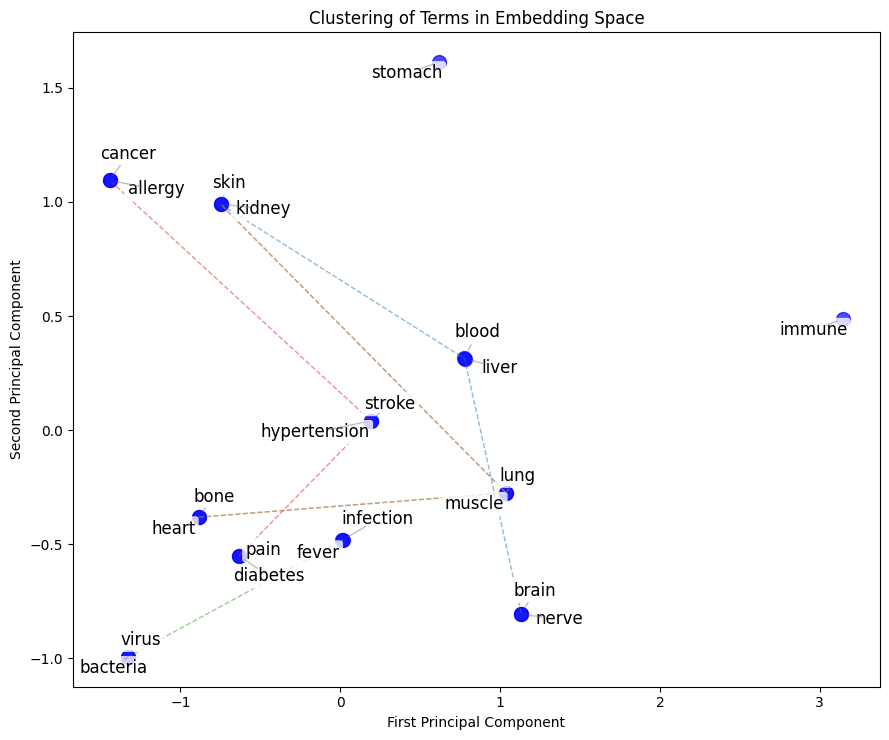

In [33]:
# Embedding Example - Step 2

!pip install adjustText > /dev/null

import torch
import torch.nn as nn
import torch.optim as optim
import numpy as np
import matplotlib.pyplot as plt
from sklearn.decomposition import PCA
from sklearn.metrics.pairwise import cosine_similarity
from adjustText import adjust_text

# Get final embeddings
final_embeddings = embedding_layer.weight.data.detach().numpy()

# Visualize the embeddings using PCA (reducing 6D to 2D for visualization)
pca = PCA(n_components=2)
embedded_2d = pca.fit_transform(final_embeddings)

print(f"\nPCA Analysis:")
print(f"Explained variance ratio: {pca.explained_variance_ratio_}")
print(f"Total explained variance: {sum(pca.explained_variance_ratio_):.3f}")

# Create visualization
fig, ax = plt.subplots(figsize=(9, 7.5))

# Plot the embeddings in 2D space
ax.scatter(embedded_2d[:, 0], embedded_2d[:, 1], s=100, alpha=0.7, c='blue')

# Create labels with white background for readability
texts = []
for i, (term, (x, y)) in enumerate(zip(medical_terms, embedded_2d)):
    texts.append(ax.text(x, y, term, fontsize=12, ha='center', va='center',
                         bbox=dict(boxstyle='round,pad=0.2', facecolor='white',
                                   edgecolor='none', alpha=0.8)))

# Draw connections between related terms BEFORE adjusting text
anatomical_groups = [
    ['heart', 'lung', 'kidney', 'liver', 'brain'],   # Organ system
    ['bone', 'muscle', 'skin'],                      # Body structure
    ['virus', 'bacteria', 'infection', 'fever'],     # Pathology
    ['diabetes', 'hypertension', 'stroke', 'cancer'] # Disease types
]

for group in anatomical_groups:
    group_indices = [medical_terms.index(term) for term in group if term in medical_terms]
    if len(group_indices) > 1:
        group_positions = embedded_2d[group_indices]
        ax.plot(group_positions[:, 0], group_positions[:, 1],
                alpha=0.5, linewidth=1, linestyle='--')

# Adjust text with constraints to keep labels near points
adjust_text(texts,
            ax=ax,
            arrowprops=dict(arrowstyle='-', color='gray', alpha=0.5, shrinkA=10, shrinkB=5),
            expand_points=(2.0, 2.0),
            force_points=(1.0, 1.0))


ax.set_title('Clustering of Terms in Embedding Space')
ax.set_xlabel('First Principal Component')
ax.set_ylabel('Second Principal Component')

plt.tight_layout()
plt.show()


If the code is correct, you should see something _similar_ to the following output:

![__](https://biologicslab.co/BIO1173/images/class_04/class_04_1_image40F.png)

### **Analysis: Medical Term Embedding Visualization**

#### **PCA Statistics**
- **First Principal Component**: Explains 43.8% of the variance
- **Second Principal Component**: Explains 19.4% of the variance
- **Total Explained Variance**: 63.3%

This means the 2D visualization captures about two-thirds of the information from the original 6-dimensional embeddings. The remaining 36.7% of the variance exists in dimensions we cannot see in this plot.

#### **Observed Clustering Patterns**

###### **Successfully Learned Relationships**

1. **Brain and Nerve** (bottom right): These terms are tightly clustered together, which makes biological sense—the brain is part of the nervous system, and nerves transmit signals to and from the brain.

2. **Virus and Bacteria** (bottom left): These pathogens are positioned very close together, reflecting their shared role as infectious agents that cause disease.

3. **Hypertension and Stroke** (center): These cardiovascular-related terms are adjacent, correctly capturing the medical relationship where hypertension is a major risk factor for stroke.

4. **Lung and Muscle** (center right): These are positioned near each other, both being essential components of the respiratory/movement systems.

5. **Pain, Fever, and Diabetes** (lower center): These symptom/condition terms cluster together in the lower portion of the plot.

6. **Cancer and Allergy** (upper left): Both represent immune system dysregulation—cancer involves uncontrolled cell growth that evades immune detection, while allergies are immune overreactions.

#### Interesting Observations

- **Blood and Liver** appear close together, which reflects their biological relationship (the liver filters and processes blood).

- **Heart and Bone** are positioned near each other in the lower left, likely because they were paired during training.

- **Immune** stands alone on the far right, separated from other terms. This may indicate the model learned it as a distinct concept, or it could benefit from more training connections.

- **Stomach** appears isolated at the top, suggesting the model didn't have strong training pairs connecting it to other digestive or organ terms.

#### **Limitations**

The dashed lines connecting semantic groups (organs, body structures, pathology, diseases) show that while some related terms cluster well, others are spread across the embedding space. This is expected because:

1. The training pairs were limited and somewhat arbitrary
2. Only 1,000 training epochs were used
3. The 6-dimensional embedding space is relatively small
4. Real medical relationships are complex and multidimensional

#### **Conclusion**

The visualization demonstrates that even with simple training data and a small neural network, **embeddings can capture meaningful semantic relationships** between medical terms. In production systems like clinical NLP tools, embeddings are trained on millions of medical documents, resulting in much richer and more accurate representations of medical knowledge.


### Embedding Example - Step 3

Finally, the code in the cell below performs a similarity analysis on the embedded terms and prints out the various relationships discovered by the analysis.

In [ ]:
# Embedding Example - Step 3

# Demonstrate similarity calculations
print("\nSimilarity Analysis:")
print("=" * 40)

# Calculate cosine similarities between some key terms
heart_idx = medical_terms.index('heart')
lung_idx = medical_terms.index('lung')
brain_idx = medical_terms.index('brain')
virus_idx = medical_terms.index('virus')

heart_emb = final_embeddings[heart_idx]
lung_emb = final_embeddings[lung_idx]
brain_emb = final_embeddings[brain_idx]
virus_emb = final_embeddings[virus_idx]

# Calculate similarities
sim_heart_lung = cosine_similarity([heart_emb], [lung_emb])[0][0]
sim_heart_brain = cosine_similarity([heart_emb], [brain_emb])[0][0]
sim_heart_virus = cosine_similarity([heart_emb], [virus_emb])[0][0]

print(f"Heart ↔ Lung similarity: {sim_heart_lung:.3f}")
print(f"Heart ↔ Brain similarity: {sim_heart_brain:.3f}")
print(f"Heart ↔ Virus similarity: {sim_heart_virus:.3f}")

# Show how embeddings can be used for medical applications
print("Medical Applications of These Embeddings:")
print("=" * 40)
print("1. Disease Diagnosis: Finding similar symptoms and conditions")
print("2. Drug Discovery: Identifying molecular relationships")
print("3. Medical Literature Analysis: Understanding concept relationships")
print("4. Clinical Decision Support: Recommending treatments based on similarity")

# Demonstrate how to use the learned embeddings
print("\nPractical Example:")
print("=" * 40)

def find_similar_terms(target_term, top_n=3):
    """Find most similar terms to a given medical term"""
    if target_term not in medical_terms:
        return f"Term '{target_term}' not found in vocabulary"

    target_idx = medical_terms.index(target_term)
    target_embedding = final_embeddings[target_idx]

    similarities = []
    for i, term in enumerate(medical_terms):
        if i != target_idx:
            similarity = cosine_similarity([target_embedding], [final_embeddings[i]])[0][0]
            similarities.append((term, similarity))

    # Sort by similarity and return top N
    similarities.sort(key=lambda x: x[1], reverse=True)
    return similarities[:top_n]

# Test with a few examples
print(f"Most similar terms to 'heart':")
for term, sim in find_similar_terms('heart'):
    print(f"  {term}: {sim:.3f}")

print(f"\nMost similar terms to 'cancer':")
for term, sim in find_similar_terms('cancer'):
    print(f"  {term}: {sim:.3f}")

# Show the embedding matrix
print(f"\nEmbedding Matrix (first 5 terms):")
print("Each row represents a medical term's learned embedding vector")
print(final_embeddings[:5])

print("\nKey Takeaway:")
print("Medical embeddings learn to represent not just words, but their meanings and relationships.")
print("This is how AI systems understand medical concepts - by learning patterns from vast amounts of medical data.")


Similarity Analysis:
Heart ↔ Lung similarity: -0.303
Heart ↔ Brain similarity: 0.120
Heart ↔ Virus similarity: -0.533
Medical Applications of These Embeddings:
1. Disease Diagnosis: Finding similar symptoms and conditions
2. Drug Discovery: Identifying molecular relationships
3. Medical Literature Analysis: Understanding concept relationships
4. Clinical Decision Support: Recommending treatments based on similarity

Practical Example:
Most similar terms to 'heart':
  bone: 1.000
  stomach: 0.472
  brain: 0.120

Most similar terms to 'cancer':
  allergy: 1.000
  pain: 0.285
  diabetes: 0.285

Embedding Matrix (first 5 terms):
Each row represents a medical term's learned embedding vector
[[-0.30134863  0.52753836  1.3753165  -0.89339685 -0.13582906 -0.43050092]
 [-1.1522872  -0.21584322 -0.17535158  0.76548094 -0.5891407   0.7453274 ]
 [ 0.44891012  1.0236136  -1.1456507   0.5880807  -1.1398064   1.1853856 ]
 [-1.1208045  -2.1282923   0.4268344  -0.04231146  0.18631214  0.76783115]
 [-0

If the code is correct, you should see something _similar_ to the following output:

![__](https://biologicslab.co/BIO1173/images/class_04/class_04_1_image41F.png)


These numbers have no inherent meaning individually—their power comes from the **relationships** between vectors.

#### **Real-World Medical Applications**

This similarity-based approach powers many healthcare AI systems:

1. **Disease Diagnosis**: Find conditions with similar symptom profiles
2. **Drug Discovery**: Identify molecules with similar properties to known drugs
3. **Medical Literature Search**: Retrieve papers about semantically related topics
4. **Clinical Decision Support**: Recommend treatments based on similar patient cases
5. **Medical Coding**: Match clinical notes to standardized diagnosis codes

#### **Key Takeaway**

Embeddings transform words from arbitrary symbols into **mathematical objects** that capture meaning. By measuring distances and similarities in embedding space, AI systems can reason about medical concepts in ways that support diagnosis, treatment, and research—all without explicitly programming medical knowledge into the system.


# **Lesson Turn-In**

When you have completed and run all of the code cells, use the `File --> Print.. --> Microsoft Print to PDF` to generate your PDF if you are running `MS Windows`. If you have a Mac, use the `File --> Print.. --> Save as PDF`

In either case, save your PDF as Copy of Class_04_4.lastname.pdf where lastname is your last name, and upload the file to Canvas.

## **Lizard Tail**

## **UNIVAC**

![___](https://upload.wikimedia.org/wikipedia/commons/2/2f/Univac_I_Census_dedication.jpg)

**UNIVAC (Universal Automatic Computer)** was a line of electronic digital stored-program computers starting with the products of the Eckert–Mauchly Computer Corporation. Later the name was applied to a division of the Remington Rand company and successor organizations.

The BINAC, built by the Eckert–Mauchly Computer Corporation, was the first general-purpose computer for commercial use, but it was not a success. The last UNIVAC-badged computer was produced in 1986.

**UNIVAC Sperry Rand label**

J. Presper Eckert and John Mauchly built the ENIAC (Electronic Numerical Integrator and Computer) at the University of Pennsylvania's Moore School of Electrical Engineering between 1943 and 1946. A 1946 patent rights dispute with the university led Eckert and Mauchly to depart the Moore School to form the Electronic Control Company, later renamed Eckert–Mauchly Computer Corporation (EMCC), based in Philadelphia, Pennsylvania. That company first built a computer called BINAC (BINary Automatic Computer) for Northrop Aviation (which was little used, or perhaps not at all). Afterwards, the development of UNIVAC began in April 1946.[1] UNIVAC was first intended for the Bureau of the Census, which paid for much of the development, and then was put in production.

With the death of EMCC's chairman and chief financial backer Henry L. Straus in a plane crash on October 25, 1949, EMCC was sold to typewriter, office machine, electric razor, and gun maker Remington Rand on February 15, 1950. Eckert and Mauchly now reported to Leslie Groves, the retired army general who had previously managed building The Pentagon and led the Manhattan Project.

The most famous UNIVAC product was the UNIVAC I mainframe computer of 1951, which became known for predicting the outcome of the U.S. presidential election the following year: this incident is noteworthy because the computer correctly predicted an Eisenhower landslide over Adlai Stevenson, whereas the final Gallup poll had Eisenhower winning the popular vote 51–49 in a close contest.

The prediction led CBS's news boss in New York, Siegfried Mickelson, to believe the computer was in error, and he refused to allow the prediction to be read. Instead, the crew showed some staged theatrics that suggested the computer was not responsive, and announced it was predicting 8–7 odds for an Eisenhower win (the actual prediction was 100–1 in his favour).

When the predictions proved true—Eisenhower defeated Stevenson in a landslide, with UNIVAC coming within 3.5% of his popular vote total and four votes of his Electoral College total—Charles Collingwood, the on-air announcer, announced that they had failed to believe the earlier prediction.

The United States Army requested a UNIVAC computer from Congress in 1951. Colonel Wade Heavey explained to the Senate subcommittee that the national mobilization planning involved multiple industries and agencies: "This is a tremendous calculating process...there are equations that can not be solved by hand or by electrically operated computing machines because they involve millions of relationships that would take a lifetime to figure out." Heavey told the subcommittee it was needed to help with mobilization and other issues similar to the invasion of Normandy that were based on the relationships of various groups.

The UNIVAC was manufactured at Remington Rand's former Eckert-Mauchly Division plant on W Allegheny Avenue in Philadelphia, Pennsylvania. Remington Rand also had an engineering research lab in Norwalk, Connecticut, and later bought Engineering Research Associates (ERA) in St. Paul, Minnesota. In 1953 or 1954 Remington Rand merged their Norwalk tabulating machine division, the ERA "scientific" computer division, and the UNIVAC "business" computer division into a single division under the UNIVAC name. This severely annoyed those who had been with ERA and with the Norwalk laboratory.

In 1955 Remington Rand merged with Sperry Corporation to become Sperry Rand. General Douglas MacArthur, then the chairman of the Board of Directors of Remington Rand, was chosen to continue in that role in the new company. Harry Franklin Vickers, then the President of Sperry Corporation, continued as president and CEO of Sperry Rand. The UNIVAC division of Remington Rand was renamed the Remington Rand Univac division of Sperry Rand. William Norris was put in charge as Vice-President and General Manager reporting to the President of the Remington Rand Division (of Sperry Rand).

### **UNIVAC: Historical Development and Significance**

**Introduction**

UNIVAC (Universal Automatic Computer) was the first commercially available computer in the United States, marking a pivotal moment in the history of computing. Developed in the early 1950s, UNIVAC played a crucial role in transitioning computing from experimental laboratories to practical business and government applications.

**Origins and Development**

### Eckert and Mauchly

UNIVAC was developed by **J. Presper Eckert** and **John Mauchly**, the same engineers who created the **ENIAC** (Electronic Numerical Integrator and Computer), the first general-purpose electronic digital computer. After ENIAC, they founded the **Eckert-Mauchly Computer Corporation** in 1946 with the goal of producing a more advanced and commercially viable computer.

### Design Goals

UNIVAC was designed to:
- Handle both numeric and alphabetic data.
- Be suitable for business and administrative use.
- Automate data processing tasks traditionally performed by punch card machines.

## Key Milestones

### UNIVAC I (1951)

- **First Delivered**: To the U.S. Census Bureau on **June 14, 1951**.
- **Technology**: Used vacuum tubes, mercury delay lines for memory, and magnetic tape for storage.
- **Speed**: Could perform approximately 1,000 calculations per second.
- **Input/Output**: Featured a typewriter-like console and tape drives.

### Commercial Impact
- **Remington Rand Acquisition**: In 1950, Eckert-Mauchly was acquired by Remington Rand, which marketed UNIVAC.
- **Presidential Election Prediction**: UNIVAC I famously predicted the outcome of the 1952 U.S. presidential election on live television, correctly forecasting Eisenhower's victory—demonstrating the power of computing to the public.

## Technical Specifications

| Feature              | Specification                          |
|----------------------|----------------------------------------|
| Memory               | 1,000 words (12 characters each)       |
| Word Size            | 72 bits                                |
| Clock Speed          | 2.25 MHz                               |
| Storage              | Magnetic tape                          |
| Programming Language | Machine code                           |

## Legacy and Influence

UNIVAC's success helped establish the viability of computers in business and government. It influenced the development of subsequent systems and contributed to the growth of the American computer industry.

### Successors

- **UNIVAC II**: Introduced in 1958 with improved memory and performance.
- **UNIVAC 1100 Series**: Became popular in the 1960s and 1970s for scientific and business applications.

### Cultural Impact

UNIVAC became a symbol of modernity and technological progress in the 1950s. Its televised election prediction helped demystify computers and sparked public interest in computing.

## Conclusion

UNIVAC was more than just a machine—it was a milestone in the evolution of computing. By bridging the gap between theoretical computing and practical application, it laid the foundation for the digital age.

## References

- Ceruzzi, Paul E. *A History of Modern Computing*. MIT Press.
- U.S. Census Bureau Archives
- Computer History Museum
